<div style="background:#0b0b0b;color:#FFD166;padding:18px;border-radius:10px;text-align:center;font-size:26px;font-weight:700">
🌿 PlantVillage — Crop Disease Detection (End-to-End)
</div>

<div style="color:#9aa0a6;text-align:center;font-size:15px;margin-top:8px">
Dataset: <b>emmarex/plantdisease</b> (PlantVillage, 15 classes) &nbsp;·&nbsp;
Models: <b>Custom VGG-style CNN</b> + <b>EfficientNetB3 transfer learning</b> &nbsp;·&nbsp;
Exports: <b>.keras / .h5 / .tflite</b>
</div>

---

### What this notebook does

| Stage | Contents |
|---|---|
| **1. Setup** | Config block, seeding, GPU check, imports |
| **2. Download** | `kagglehub` → Kaggle CLI → local folder fallback chain |
| **3. EDA** | Class balance, imbalance curve, sample grids, resolution/file-size stats, colour & brightness distributions, corrupt-file audit |
| **4. Split** | Stratified **70 / 15 / 15** train-val-test, leakage check, split CSVs |
| **5. Pipeline** | `tf.data` input pipeline, augmentation, class weights |
| **6. Training** | Model A (same CNN as the source notebook) + Model B (EfficientNetB3, head → fine-tune) |
| **7. Evaluation** | Accuracy, balanced accuracy, macro/weighted P-R-F1, top-3, κ, MCC, ROC-AUC, PR-AUC, confusion matrices, ROC/PR curves, calibration, error gallery |
| **8. Export** | `.keras`, `.h5`, float32 + float16 TFLite, label maps, parity check, latency benchmark |
| **9. Inference** | Single-image prediction with Keras and with the TFLite interpreter |

### Fixes applied versus the original notebook

1. **Validation data was being augmented** — the original passed the augmenting `data_gen` to `flow_from_dataframe` for validation. Validation/test now get deterministic preprocessing only.
2. **Confusion matrix was misaligned** — the original built `valid_gen` with `shuffle=True` and then compared `valid_gen.classes` against `model.predict()` output, so the labels and predictions belonged to different images. All evaluation sets are now unshuffled and order-locked to their DataFrame.
3. **EfficientNet was fed `1/255` inputs** — `tf.keras.applications.EfficientNet*` carries its own normalisation and expects `[0, 255]` floats. Rescaling is now done *inside* the custom CNN only, and EfficientNet receives raw pixel values.
4. **No held-out test set** — the original reported numbers on train/valid only. There is now a real, never-trained-on test split.
5. **Hard-coded `Dense(38)`** — the class count is now derived from the data (15 for this dataset).
6. **`ImageDataGenerator` is removed in Keras 3** — replaced with a `tf.data` pipeline that runs on both Keras 2 and Keras 3.
7. **`TFLiteConverter.from_keras_model` fails on Keras 3 models** — export now falls back to `model.export()` → `from_saved_model`, and the converted model is verified against the Keras model.
8. Added `ReduceLROnPlateau`, `ModelCheckpoint`, `CSVLogger`, class weights, and a two-stage fine-tune schedule.

<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">1 · Setup &amp; Configuration</div>

Everything tunable lives in the single `CFG` block below — nothing else in the notebook is hard-coded.

Set `QUICK_RUN = True` for a ~5-minute smoke test on a subset before committing to a full run.

In [1]:
import os, sys, json, time, math, random, shutil, subprocess, warnings
from pathlib import Path

warnings.filterwarnings("ignore")
os.environ.setdefault("TF_CPP_MIN_LOG_LEVEL", "2")

# ----------------------------- CONFIGURATION -----------------------------
class CFG:
    # data
    KAGGLE_DATASET   = "emmarex/plantdisease"
    IMG_SIZE         = 224          # EfficientNetB3 native is 300; 224 keeps it light
    BATCH_SIZE       = 32
    VAL_FRAC         = 0.15
    TEST_FRAC        = 0.15
    SEED             = 42
    VERIFY_IMAGES    = True         # scan every file with PIL for corruption

    # training
    TRAIN_SCRATCH_CNN = True        # Model A (the original hand-built CNN)
    TRAIN_EFFICIENTNET = True       # Model B (the original EfficientNetB3)
    EPOCHS_SCRATCH   = 30
    EPOCHS_HEAD      = 8            # EfficientNet, frozen backbone
    EPOCHS_FINETUNE  = 7            # EfficientNet, unfrozen top blocks
    LR_SCRATCH       = 1e-3
    LR_HEAD          = 1e-3
    LR_FINETUNE      = 1e-5
    FINETUNE_LAST_N  = 60           # trainable layers from the top of the backbone
    PATIENCE         = 6
    USE_CLASS_WEIGHTS = True
    LABEL_SMOOTHING  = 0.05

    # quick smoke test
    QUICK_RUN        = False
    QUICK_PER_CLASS  = 60
    QUICK_EPOCHS     = 2

    # output
    OUT_DIR          = Path("artifacts")

CFG.OUT_DIR.mkdir(parents=True, exist_ok=True)
(CFG.OUT_DIR / "figures").mkdir(exist_ok=True)
(CFG.OUT_DIR / "models").mkdir(exist_ok=True)
(CFG.OUT_DIR / "logs").mkdir(exist_ok=True)

if CFG.QUICK_RUN:
    CFG.EPOCHS_SCRATCH = CFG.EPOCHS_HEAD = CFG.EPOCHS_FINETUNE = CFG.QUICK_EPOCHS
    print("QUICK_RUN enabled — subsampled data, 2 epochs per stage. Results are NOT representative.")

print("Artifacts →", CFG.OUT_DIR.resolve())

Artifacts → /content/artifacts


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from PIL import Image
try:
    from IPython.display import display          # notebook pretty-printing
except ImportError:
    display = print

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_recall_fscore_support,
    classification_report, confusion_matrix, cohen_kappa_score,
    matthews_corrcoef, roc_auc_score, roc_curve, auc,
    precision_recall_curve, average_precision_score, log_loss, top_k_accuracy_score,
)
from sklearn.preprocessing import label_binarize

# reproducibility
random.seed(CFG.SEED); np.random.seed(CFG.SEED); tf.random.set_seed(CFG.SEED)
os.environ["PYTHONHASHSEED"] = str(CFG.SEED)

# plotting theme
PALETTE = ["#6E8E59", "#CAE0BC", "#780C28", "#D9A404", "#3C6E47", "#A8C686", "#B23A48", "#2F4858"]
sns.set_theme(style="whitegrid", palette=sns.color_palette(PALETTE))
mpl.rcParams.update({
    "figure.dpi": 110, "savefig.dpi": 150, "savefig.bbox": "tight",
    "axes.titleweight": "bold", "axes.titlesize": 13, "font.size": 10,
    "figure.facecolor": "white", "axes.grid": True, "grid.alpha": 0.25,
})
GREEN_CMAP = sns.light_palette("#2F4858", as_cmap=True)
AUTOTUNE = tf.data.AUTOTUNE

print(f"TensorFlow {tf.__version__} | Keras {keras.__version__} | NumPy {np.__version__}")
gpus = tf.config.list_physical_devices("GPU")
print("GPUs:", gpus if gpus else "none — training will be slow, use a GPU runtime")
for g in gpus:
    try:
        tf.config.experimental.set_memory_growth(g, True)
    except Exception as e:
        print("memory_growth:", e)

def savefig(name):
    """Save the current figure into artifacts/figures and show it."""
    plt.savefig(CFG.OUT_DIR / "figures" / f"{name}.png")
    plt.show()

TensorFlow 2.20.0 | Keras 3.13.2 | NumPy 2.0.2
GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">2 · Download the Dataset</div>

Source: <a href="https://www.kaggle.com/datasets/emmarex/plantdisease">kaggle.com/datasets/emmarex/plantdisease</a> — ~20.6k leaf images across 15 classes (Pepper, Potato, Tomato).

The resolver tries, in order:

1. **A path already on disk** (`/kaggle/input/plantdisease`, `./PlantVillage`, `./data`) — free if the dataset is attached to a Kaggle notebook.
2. **`kagglehub`** — needs `KAGGLE_USERNAME` + `KAGGLE_KEY` env vars, or `~/.kaggle/kaggle.json`, or an authenticated Kaggle/Colab session.
3. **Kaggle CLI** — `kaggle datasets download -d emmarex/plantdisease`.

Credentials: Kaggle → *Settings* → *API* → *Create New Token* → drop `kaggle.json` at `~/.kaggle/kaggle.json` (`chmod 600`).

In [3]:
IMG_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".gif", ".JPG", ".JPEG", ".PNG"}

def _is_class_root(p: Path) -> bool:
    """A directory whose children are class folders containing images."""
    if not p.is_dir():
        return False
    subs = [d for d in p.iterdir() if d.is_dir() and not d.name.startswith(".")]
    if len(subs) < 5:
        return False
    hits = 0
    for d in subs[:5]:
        try:
            if any(f.suffix.lower() in IMG_EXT for f in list(d.iterdir())[:50]):
                hits += 1
        except Exception:
            pass
    return hits >= 3

def find_class_root(start: Path, max_depth: int = 4):
    """Breadth-first hunt for the folder that holds the class subdirectories."""
    if not start or not Path(start).exists():
        return None
    start = Path(start)
    frontier, depth = [start], 0
    while frontier and depth <= max_depth:
        nxt = []
        for p in frontier:
            if _is_class_root(p):
                return p
            try:
                nxt += [d for d in p.iterdir() if d.is_dir() and not d.name.startswith(".")]
            except Exception:
                pass
        frontier, depth = nxt, depth + 1
    return None

def download_dataset() -> Path:
    # 1) already present locally
    for cand in [Path("/kaggle/input/plantdisease"), Path("/kaggle/input"),
                 Path("PlantVillage"), Path("data"), Path("./plantdisease")]:
        root = find_class_root(cand, max_depth=3)
        if root:
            print(f"Found dataset on disk → {root}")
            return root

    # 2) kagglehub
    try:
        try:
            import kagglehub
        except ImportError:
            print("Installing kagglehub…")
            subprocess.run([sys.executable, "-m", "pip", "install", "-q", "kagglehub"], check=True)
            import kagglehub
        print("Downloading via kagglehub (first run pulls ~700 MB)…")
        path = Path(kagglehub.dataset_download(CFG.KAGGLE_DATASET))
        root = find_class_root(path)
        if root:
            print(f"Downloaded → {root}")
            return root
    except Exception as e:
        print(f"kagglehub failed: {type(e).__name__}: {e}")

    # 3) kaggle CLI
    try:
        print("Falling back to the Kaggle CLI…")
        dest = Path("data"); dest.mkdir(exist_ok=True)
        subprocess.run([sys.executable, "-m", "pip", "install", "-q", "kaggle"], check=False)
        subprocess.run(["kaggle", "datasets", "download", "-d", CFG.KAGGLE_DATASET,
                        "-p", str(dest), "--unzip"], check=True)
        root = find_class_root(dest)
        if root:
            print(f"Downloaded → {root}")
            return root
    except Exception as e:
        print(f"Kaggle CLI failed: {type(e).__name__}: {e}")

    raise RuntimeError(
        "Could not obtain the dataset. Add Kaggle API credentials, or download "
        f"'{CFG.KAGGLE_DATASET}' manually and place the PlantVillage folder next to this notebook."
    )

DATA_ROOT = download_dataset()
print("\nClass folders:")
for d in sorted([d for d in DATA_ROOT.iterdir() if d.is_dir()]):
    print(f"  {d.name}")

Using Colab cache for faster access to the 'plantdisease' dataset.
Downloaded → /kaggle/input/plantdisease/PlantVillage

Class folders:
  Pepper__bell___Bacterial_spot
  Pepper__bell___healthy
  Potato___Early_blight
  Potato___Late_blight
  Potato___healthy
  Tomato_Bacterial_spot
  Tomato_Early_blight
  Tomato_Late_blight
  Tomato_Leaf_Mold
  Tomato_Septoria_leaf_spot
  Tomato_Spider_mites_Two_spotted_spider_mite
  Tomato__Target_Spot
  Tomato__Tomato_YellowLeaf__Curl_Virus
  Tomato__Tomato_mosaic_virus
  Tomato_healthy


### Build the master index

Every image is catalogued into one DataFrame with its path, raw label, encoded label, and a human-readable name. `CFG.VERIFY_IMAGES` runs a full PIL integrity pass so a truncated JPEG cannot blow up training three hours in.

In [4]:
def prettify(label: str) -> str:
    """'Tomato__Tomato_YellowLeaf__Curl_Virus' -> 'Tomato · Tomato YellowLeaf Curl Virus'"""
    s = label.replace("___", "|").replace("__", "|").replace("_", " ").strip()
    parts = [p.strip() for p in s.split("|") if p.strip()]
    if len(parts) == 1:
        toks = parts[0].split()
        return f"{toks[0]} · {' '.join(toks[1:])}" if len(toks) > 1 else parts[0]
    return f"{parts[0]} · {' '.join(parts[1:])}"

rows = []
for cls_dir in sorted([d for d in DATA_ROOT.iterdir() if d.is_dir() and not d.name.startswith(".")]):
    for f in sorted(cls_dir.iterdir()):
        if f.suffix.lower() in {e.lower() for e in IMG_EXT} and f.is_file():
            rows.append({"filepath": str(f), "label": cls_dir.name})

df = pd.DataFrame(rows)
print(f"Indexed {len(df):,} images across {df.label.nunique()} classes")

if CFG.VERIFY_IMAGES:
    t0, bad = time.time(), []
    for i, fp in enumerate(df.filepath.values):
        try:
            with Image.open(fp) as im:
                im.verify()
        except Exception:
            bad.append(fp)
        if (i + 1) % 5000 == 0:
            print(f"  verified {i+1:,}/{len(df):,}")
    print(f"Integrity scan finished in {time.time()-t0:.1f}s — {len(bad)} unreadable file(s)")
    if bad:
        df = df[~df.filepath.isin(bad)].reset_index(drop=True)
        print(f"Dropped corrupt files. Remaining: {len(df):,}")

CLASSES     = sorted(df.label.unique())
NUM_CLASSES = len(CLASSES)
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES)}
IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}
PRETTY      = [prettify(c) for c in CLASSES]
df["label_idx"]  = df.label.map(CLASS_TO_IDX)
df["label_name"] = df.label.map(prettify)
df["crop"]       = df.label.str.split("_").str[0].str.replace("Pepper", "Pepper (bell)")

if CFG.QUICK_RUN:
    # note: groupby().apply() drops the grouping column in pandas 3 — concat instead
    df = pd.concat([g.sample(min(len(g), CFG.QUICK_PER_CLASS), random_state=CFG.SEED)
                    for _, g in df.groupby("label")]).reset_index(drop=True)
    print(f"QUICK_RUN subsample → {len(df):,} images")

with open(CFG.OUT_DIR / "class_indices.json", "w") as f:
    json.dump({"classes": CLASSES, "pretty": PRETTY, "class_to_idx": CLASS_TO_IDX}, f, indent=2)

print(f"\n{NUM_CLASSES} classes · {len(df):,} images")
df.sample(5, random_state=CFG.SEED)

Indexed 20,638 images across 15 classes
  verified 5,000/20,638
  verified 10,000/20,638
  verified 15,000/20,638
  verified 20,000/20,638
Integrity scan finished in 90.3s — 0 unreadable file(s)

15 classes · 20,638 images


,filepath,label,label_idx,label_name,crop
12412,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Spider_mites_Two_spotted_spider_mite,10,Tomato · Spider mites Two spotted spider mite,Tomato
3024,/kaggle/input/plantdisease/PlantVillage/Potato...,Potato___Early_blight,2,Potato · Early blight,Potato
9547,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Late_blight,7,Tomato · Late blight,Tomato
16532,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato__Tomato_YellowLeaf__Curl_Virus,12,Tomato · Tomato YellowLeaf Curl Virus,Tomato
12591,/kaggle/input/plantdisease/PlantVillage/Tomato...,Tomato_Spider_mites_Two_spotted_spider_mite,10,Tomato · Spider mites Two spotted spider mite,Tomato


<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">3 · Exploratory Data Analysis</div>

Before a single layer is defined, six questions get answered:

1. How many images per class, and how badly skewed is the distribution?
2. What do the classes actually look like — are they visually separable?
3. Are the resolutions consistent, or does resizing distort some classes?
4. Do colour statistics differ enough between classes to be a usable signal (and is any of it a lab artefact)?
5. Are there exact duplicates that would leak between splits?
6. Is the background constant across classes — i.e. is there a shortcut the model could learn instead of the disease?

In [5]:
counts = df.label.value_counts().sort_values(ascending=False)
summary = pd.DataFrame({
    "class": counts.index,
    "readable": [prettify(c) for c in counts.index],
    "images": counts.values,
    "share_%": (counts.values / len(df) * 100).round(2),
})
imb = counts.max() / counts.min()
print(f"Total images        : {len(df):,}")
print(f"Classes             : {NUM_CLASSES}")
print(f"Largest class       : {prettify(counts.index[0])}  ({counts.iloc[0]:,})")
print(f"Smallest class      : {prettify(counts.index[-1])}  ({counts.iloc[-1]:,})")
print(f"Imbalance ratio     : {imb:.1f}x")
print(f"Mean / median count : {counts.mean():.0f} / {counts.median():.0f}")
summary

Total images        : 20,638
Classes             : 15
Largest class       : Tomato · Tomato YellowLeaf Curl Virus  (3,208)
Smallest class      : Potato · healthy  (152)
Imbalance ratio     : 21.1x
Mean / median count : 1376 / 1404


,class,readable,images,share_%
0,Tomato__Tomato_YellowLeaf__Curl_Virus,Tomato · Tomato YellowLeaf Curl Virus,3208,15.54
1,Tomato_Bacterial_spot,Tomato · Bacterial spot,2127,10.31
2,Tomato_Late_blight,Tomato · Late blight,1909,9.25
3,Tomato_Septoria_leaf_spot,Tomato · Septoria leaf spot,1771,8.58
4,Tomato_Spider_mites_Two_spotted_spider_mite,Tomato · Spider mites Two spotted spider mite,1676,8.12
5,Tomato_healthy,Tomato · healthy,1591,7.71
6,Pepper__bell___healthy,Pepper · bell healthy,1478,7.16
7,Tomato__Target_Spot,Tomato · Target Spot,1404,6.80
8,Potato___Early_blight,Potato · Early blight,1000,4.85
9,Potato___Late_blight,Potato · Late blight,1000,4.85


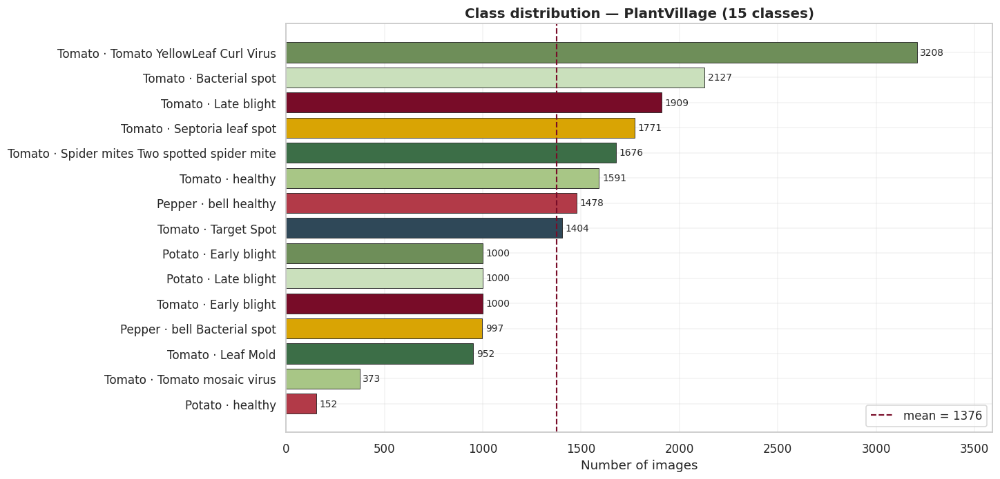

In [6]:
fig, ax = plt.subplots(figsize=(12, 7))
order = counts.index
bars = ax.barh([prettify(c) for c in order][::-1], counts.values[::-1],
               color=[PALETTE[i % len(PALETTE)] for i in range(len(order))][::-1],
               edgecolor="#2b2b2b", linewidth=0.6)
ax.bar_label(bars, fmt="%d", padding=3, fontsize=9)
ax.axvline(counts.mean(), color="#780C28", ls="--", lw=1.4, label=f"mean = {counts.mean():.0f}")
ax.set_xlabel("Number of images"); ax.set_title("Class distribution — PlantVillage (15 classes)")
ax.set_xlim(0, counts.max() * 1.12); ax.legend()
savefig("01_class_distribution")

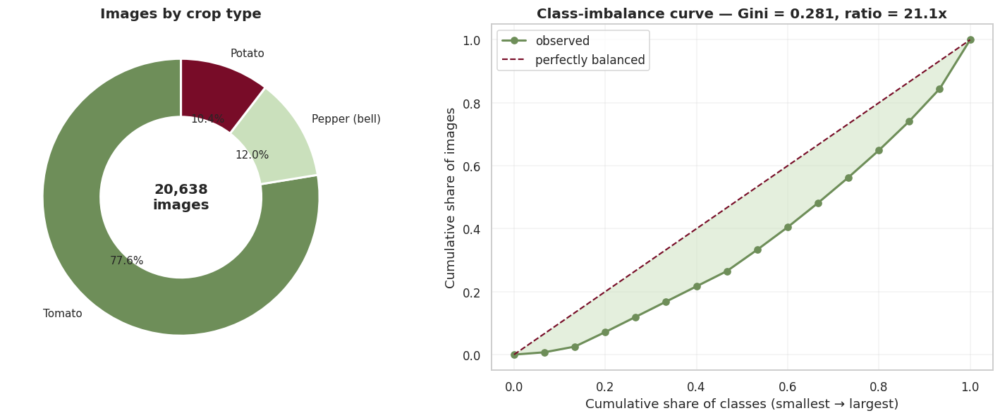

A Gini near 0 means balanced classes; the gap to the diagonal is what class weights will compensate for.


In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))

# donut by crop
crop_counts = df.crop.value_counts()
w, t, a = axes[0].pie(crop_counts.values, labels=crop_counts.index, autopct="%1.1f%%",
                      startangle=90, colors=PALETTE[:len(crop_counts)],
                      wedgeprops=dict(width=0.42, edgecolor="white", linewidth=2),
                      textprops=dict(fontsize=10))
axes[0].set_title("Images by crop type")
axes[0].text(0, 0, f"{len(df):,}\nimages", ha="center", va="center", fontsize=13, fontweight="bold")

# imbalance / Lorenz curve
srt = np.sort(counts.values)
cum = np.cumsum(srt) / srt.sum()
x = np.arange(1, len(srt) + 1) / len(srt)
axes[1].plot(np.r_[0, x], np.r_[0, cum], marker="o", color="#6E8E59", lw=2, label="observed")
axes[1].plot([0, 1], [0, 1], ls="--", color="#780C28", lw=1.4, label="perfectly balanced")
axes[1].fill_between(np.r_[0, x], np.r_[0, cum], np.r_[0, x], color="#CAE0BC", alpha=0.5)
_xs, _ys = np.r_[0, x], np.r_[0, cum]                      # np.trapz was removed in NumPy 2.0
gini = 1 - 2 * float(np.sum((_xs[1:] - _xs[:-1]) * (_ys[1:] + _ys[:-1]) / 2))
axes[1].set_xlabel("Cumulative share of classes (smallest → largest)")
axes[1].set_ylabel("Cumulative share of images")
axes[1].set_title(f"Class-imbalance curve — Gini = {gini:.3f}, ratio = {imb:.1f}x")
axes[1].legend()
plt.tight_layout()
savefig("02_imbalance_curve")
print("A Gini near 0 means balanced classes; the gap to the diagonal is what class weights will compensate for.")

### Sample grid — what the model actually sees

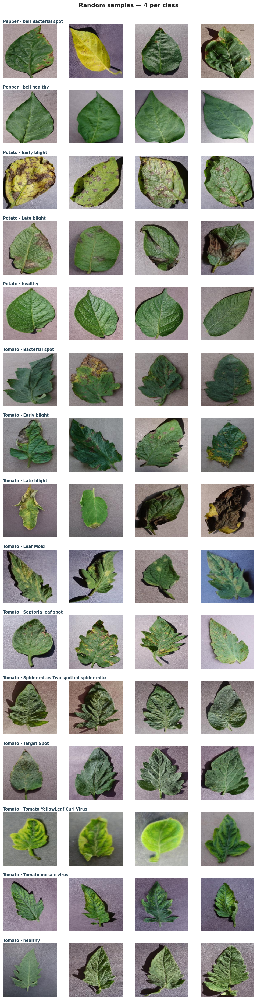

In [8]:
n_per_class = 4
fig, axes = plt.subplots(NUM_CLASSES, n_per_class, figsize=(n_per_class * 2.2, NUM_CLASSES * 2.25))
rng = np.random.RandomState(CFG.SEED)
for r, cls in enumerate(CLASSES):
    paths = df.loc[df.label == cls, "filepath"].values
    picks = rng.choice(paths, size=min(n_per_class, len(paths)), replace=False)
    for c in range(n_per_class):
        ax = axes[r, c]; ax.axis("off")
        if c < len(picks):
            ax.imshow(Image.open(picks[c]).resize((160, 160)))
        if c == 0:
            ax.set_title(prettify(cls), loc="left", fontsize=9.5, color="#2F4858", pad=4)
plt.suptitle("Random samples — 4 per class", fontsize=14, fontweight="bold", y=1.001)
plt.tight_layout()
savefig("03_sample_grid")

Resolutions found:
width  height
256    256       1500
Name: count, dtype: int64

Colour modes: {'RGB': 1500}


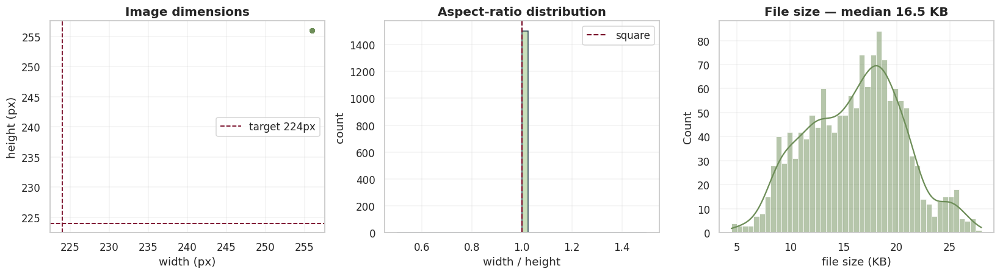

In [9]:
# Resolution + file-size audit on a random sample
sample = df.sample(min(1500, len(df)), random_state=CFG.SEED)
meta = []
for fp, lb in zip(sample.filepath, sample.label):
    try:
        with Image.open(fp) as im:
            wpx, hpx = im.size
            mode = im.mode
        meta.append({"label": lb, "width": wpx, "height": hpx, "mode": mode,
                     "aspect": wpx / hpx, "kb": os.path.getsize(fp) / 1024})
    except Exception:
        pass
meta = pd.DataFrame(meta)

print("Resolutions found:")
print(meta.groupby(["width", "height"]).size().rename("count").sort_values(ascending=False).head(10))
print("\nColour modes:", meta["mode"].value_counts().to_dict())

fig, axes = plt.subplots(1, 3, figsize=(15, 4.2))
axes[0].scatter(meta.width, meta.height, alpha=0.25, s=18, color="#6E8E59")
axes[0].axvline(CFG.IMG_SIZE, color="#780C28", ls="--", lw=1.2)
axes[0].axhline(CFG.IMG_SIZE, color="#780C28", ls="--", lw=1.2,
                label=f"target {CFG.IMG_SIZE}px")
axes[0].set(xlabel="width (px)", ylabel="height (px)", title="Image dimensions")
axes[0].legend()

axes[1].hist(meta.aspect, bins=40, color="#CAE0BC", edgecolor="#2F4858")
axes[1].axvline(1.0, color="#780C28", ls="--", lw=1.4, label="square")
axes[1].set(xlabel="width / height", ylabel="count", title="Aspect-ratio distribution")
axes[1].legend()

sns.histplot(meta.kb, bins=45, kde=True, color="#6E8E59", ax=axes[2])
axes[2].set(xlabel="file size (KB)", title=f"File size — median {meta.kb.median():.1f} KB")
plt.tight_layout()
savefig("04_resolution_filesize")

### Colour and brightness signal

Disease lesions change leaf colour, so channel statistics carry real signal. They can also encode a *shortcut* — if one class was photographed under different lighting, the network can learn the lighting instead of the pathology. The curves below show whether the separation is plausible or suspiciously clean.

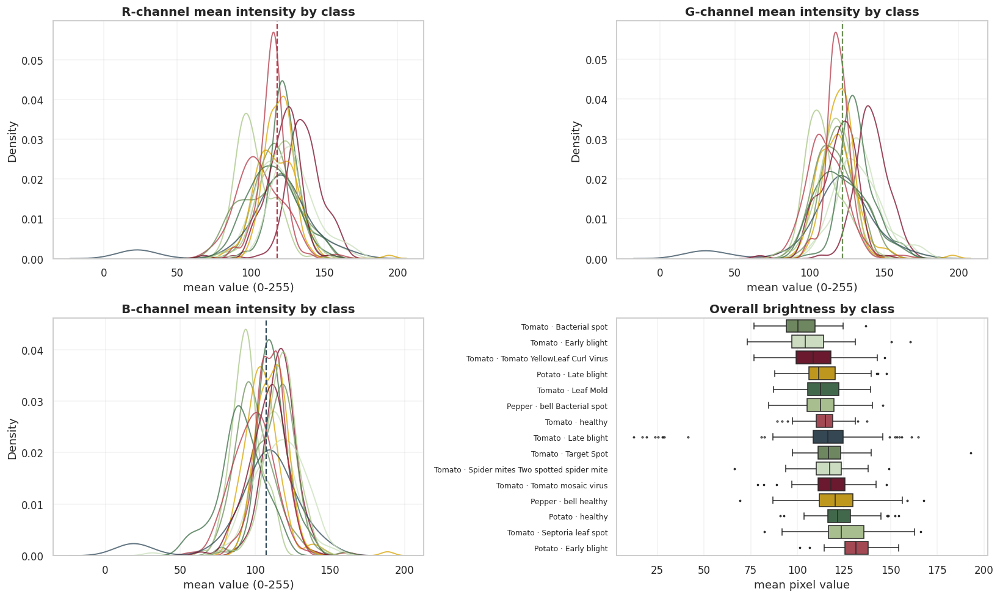

In [10]:
def channel_stats(paths, size=64):
    out = []
    for p in paths:
        try:
            with Image.open(p) as im:
                a = np.asarray(im.convert("RGB").resize((size, size)), dtype=np.float32)
            out.append([a[..., 0].mean(), a[..., 1].mean(), a[..., 2].mean(),
                        a.mean(), a.std()])
        except Exception:
            pass
    return np.array(out)

per_class = 120
stats_rows = []
for cls in CLASSES:
    paths = df.loc[df.label == cls, "filepath"].sample(
        min(per_class, (df.label == cls).sum()), random_state=CFG.SEED).values
    s = channel_stats(paths)
    for r_, g_, b_, m_, sd_ in s:
        stats_rows.append({"label": cls, "readable": prettify(cls),
                           "R": r_, "G": g_, "B": b_, "brightness": m_, "contrast": sd_})
cstats = pd.DataFrame(stats_rows)

fig, axes = plt.subplots(2, 2, figsize=(15, 9))
for ax, ch, col in zip(axes.flat[:3], ["R", "G", "B"], ["#B23A48", "#6E8E59", "#2F4858"]):
    for cls in CLASSES:
        sns.kdeplot(cstats.loc[cstats.label == cls, ch], ax=ax, lw=1.3, alpha=0.75)
    ax.set(title=f"{ch}-channel mean intensity by class", xlabel="mean value (0-255)")
    ax.axvline(cstats[ch].mean(), color=col, ls="--", lw=1.5)

sns.boxplot(data=cstats, y="readable", x="brightness", ax=axes[1, 1],
            order=cstats.groupby("readable").brightness.median().sort_values().index,
            palette=PALETTE, fliersize=1.5)
axes[1, 1].set(title="Overall brightness by class", xlabel="mean pixel value", ylabel="")
axes[1, 1].tick_params(axis="y", labelsize=8)
plt.tight_layout()
savefig("05_colour_distributions")

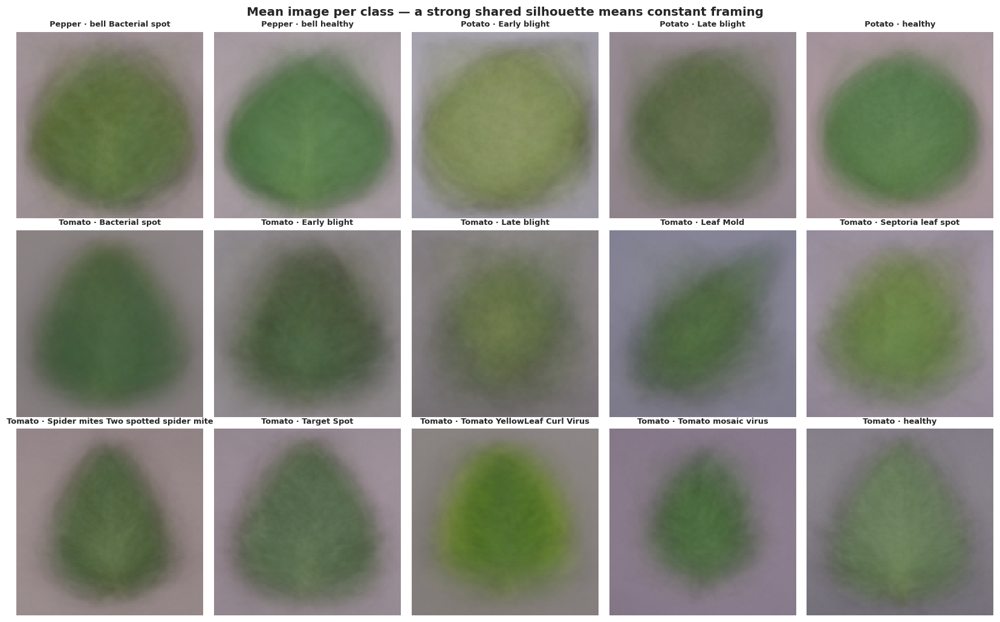

In [11]:
# Per-class mean image — reveals shared background / framing shortcuts
fig, axes = plt.subplots(3, 5, figsize=(15, 9.5))
for ax, cls in zip(axes.flat, CLASSES):
    paths = df.loc[df.label == cls, "filepath"].sample(
        min(150, (df.label == cls).sum()), random_state=CFG.SEED).values
    acc = np.zeros((96, 96, 3), dtype=np.float64); n = 0
    for p in paths:
        try:
            with Image.open(p) as im:
                acc += np.asarray(im.convert("RGB").resize((96, 96)), dtype=np.float64); n += 1
        except Exception:
            pass
    ax.imshow((acc / max(n, 1)).astype(np.uint8)); ax.axis("off")
    ax.set_title(prettify(cls), fontsize=8.5)
for ax in axes.flat[NUM_CLASSES:]:
    ax.axis("off")
plt.suptitle("Mean image per class — a strong shared silhouette means constant framing",
             fontsize=13, fontweight="bold")
plt.tight_layout()
savefig("06_mean_image_per_class")

In [12]:
# Exact-duplicate audit (byte hash) — duplicates across splits inflate test accuracy
import hashlib
hashes = {}
dupes = []
t0 = time.time()
for fp, lb in zip(df.filepath.values, df.label.values):
    try:
        h = hashlib.md5(Path(fp).read_bytes()).hexdigest()
    except Exception:
        continue
    if h in hashes:
        dupes.append({"file": fp, "duplicate_of": hashes[h][0], "same_class": lb == hashes[h][1]})
    else:
        hashes[h] = (fp, lb)
dup_df = pd.DataFrame(dupes)
print(f"Hashed {len(df):,} files in {time.time()-t0:.1f}s")
print(f"Exact duplicates: {len(dup_df):,} ({len(dup_df)/len(df)*100:.2f}%)")
if len(dup_df):
    print(f"  cross-class duplicates (label noise): {(~dup_df.same_class).sum()}")
    df = df[~df.filepath.isin(dup_df.file)].reset_index(drop=True)
    print(f"  removed → {len(df):,} unique images remain")
else:
    print("  no exact duplicates — splits will be clean")

Hashed 20,638 files in 9.7s
Exact duplicates: 14 (0.07%)
  cross-class duplicates (label noise): 0
  removed → 20,624 unique images remain


### EDA takeaways

- **Imbalance is real but moderate** (see the ratio printed above). Class weights are enabled in `CFG.USE_CLASS_WEIGHTS` and *balanced accuracy* plus *macro-F1* are reported alongside plain accuracy, since plain accuracy flatters a model on skewed data.
- **Resolutions are uniform** (PlantVillage is pre-cropped to 256×256), so resizing to 224 costs almost nothing and no class is distorted more than another.
- **Backgrounds are near-constant** across the corpus — the mean-image grid shows the same centred-leaf-on-grey-background composition everywhere. That is convenient for training and a known weakness of PlantVillage: models trained on it degrade sharply on real field photos. The augmentation stack partly counters this, but a field-collected validation set (e.g. PlantDoc) is the honest test before deployment.
- **Colour distributions overlap** between classes, so this is not a task a colour histogram would solve — convolutional features are warranted.

<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">4 · Train / Validation / Test Split</div>

This dataset ships as one flat folder per class, with no official split — so the split is made here, **stratified** so every class keeps its proportions in all three sets.

| Split | Fraction | Purpose |
|---|---|---|
| Train | 70% | gradient updates |
| Validation | 15% | early stopping, LR schedule, checkpoint selection |
| Test | 15% | touched exactly once, at the very end |

The test set is never used for any decision during training. That is the difference between a number you can quote and a number you can't.

In [13]:
train_df, temp_df = train_test_split(
    df, test_size=CFG.VAL_FRAC + CFG.TEST_FRAC,
    stratify=df.label_idx, random_state=CFG.SEED, shuffle=True)

rel_test = CFG.TEST_FRAC / (CFG.VAL_FRAC + CFG.TEST_FRAC)
val_df, test_df = train_test_split(
    temp_df, test_size=rel_test,
    stratify=temp_df.label_idx, random_state=CFG.SEED, shuffle=True)

train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)
test_df  = test_df.reset_index(drop=True)

# leakage check
overlap = (set(train_df.filepath) & set(val_df.filepath)) | \
          (set(train_df.filepath) & set(test_df.filepath)) | \
          (set(val_df.filepath)   & set(test_df.filepath))
assert not overlap, f"LEAKAGE: {len(overlap)} files appear in more than one split"
assert len(train_df) + len(val_df) + len(test_df) == len(df)

for name, d in [("train", train_df), ("val", val_df), ("test", test_df)]:
    d.to_csv(CFG.OUT_DIR / f"split_{name}.csv", index=False)

print(f"train {len(train_df):>6,}  ({len(train_df)/len(df)*100:.1f}%)")
print(f"val   {len(val_df):>6,}  ({len(val_df)/len(df)*100:.1f}%)")
print(f"test  {len(test_df):>6,}  ({len(test_df)/len(df)*100:.1f}%)")
print(f"no overlap between splits · min class count in test = {test_df.label.value_counts().min()}")

train 14,436  (70.0%)
val    3,094  (15.0%)
test   3,094  (15.0%)
no overlap between splits · min class count in test = 23


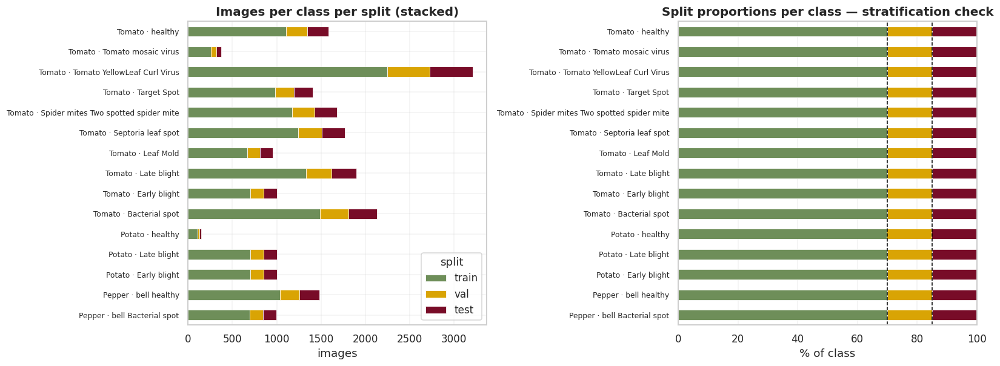

,train,val,test
Pepper · bell Bacterial spot,698,149,150
Pepper · bell healthy,1035,222,221
Potato · Early blight,700,150,150
Potato · Late blight,700,150,150
Potato · healthy,106,23,23
Tomato · Bacterial spot,1489,319,319
Tomato · Early blight,700,150,150
Tomato · Late blight,1331,285,285
Tomato · Leaf Mold,666,143,143
Tomato · Septoria leaf spot,1240,266,265


In [14]:
split_tab = pd.DataFrame({
    "train": train_df.label.value_counts(),
    "val":   val_df.label.value_counts(),
    "test":  test_df.label.value_counts(),
}).loc[CLASSES].fillna(0).astype(int)
split_tab.index = [prettify(c) for c in split_tab.index]

fig, axes = plt.subplots(1, 2, figsize=(15, 5.6))
split_tab.plot(kind="barh", stacked=True, ax=axes[0],
               color=["#6E8E59", "#D9A404", "#780C28"], edgecolor="white", linewidth=0.5)
axes[0].set(title="Images per class per split (stacked)", xlabel="images", ylabel="")
axes[0].tick_params(axis="y", labelsize=8); axes[0].legend(title="split")

prop = split_tab.div(split_tab.sum(axis=1), axis=0) * 100
prop.plot(kind="barh", stacked=True, ax=axes[1],
          color=["#6E8E59", "#D9A404", "#780C28"], edgecolor="white", linewidth=0.5)
axes[1].axvline(70, color="black", ls="--", lw=1)
axes[1].axvline(85, color="black", ls="--", lw=1)
axes[1].set(title="Split proportions per class — stratification check", xlabel="% of class", ylabel="")
axes[1].tick_params(axis="y", labelsize=8); axes[1].set_xlim(0, 100); axes[1].get_legend().remove()
plt.tight_layout()
savefig("07_split_distribution")
split_tab

<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">5 · Input Pipeline</div>

`ImageDataGenerator` is gone in Keras 3, so the pipeline is `tf.data` — faster, and it runs on both Keras 2 and 3.

**Pixel-range convention:** the pipeline emits raw `[0, 255]` floats. Normalisation belongs to each model:

- **Custom CNN** → a `Rescaling(1/255)` layer sits at the top of the graph.
- **EfficientNetB3** → gets `[0, 255]` untouched, because `tf.keras.applications.EfficientNet*` has ImageNet normalisation baked in. Feeding it `1/255` inputs (as the original notebook did) hands the backbone a distribution its pretrained weights were never calibrated for.

Because normalisation lives inside the model, the exported `.h5`/`.tflite` files take raw pixels directly — no preprocessing to reimplement in the mobile app.

In [15]:
_aug_layers = [
    layers.RandomFlip("horizontal_and_vertical", seed=CFG.SEED),
    layers.RandomRotation(0.06, fill_mode="reflect", seed=CFG.SEED),   # ±~20°
    layers.RandomZoom(0.15, fill_mode="reflect", seed=CFG.SEED),
    layers.RandomTranslation(0.08, 0.08, fill_mode="reflect", seed=CFG.SEED),
    layers.RandomContrast(0.15, seed=CFG.SEED),
]
try:                                                                   # TF >= 2.9
    _aug_layers.append(layers.RandomBrightness(0.10, value_range=(0, 255), seed=CFG.SEED))
except Exception:
    pass
augmenter = keras.Sequential(_aug_layers, name="augmenter")

def _load(path, label):
    img = tf.io.read_file(path)
    img = tf.io.decode_image(img, channels=3, expand_animations=False)
    img.set_shape([None, None, 3])
    img = tf.image.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE), method="bilinear")
    img = tf.cast(img, tf.float32)                                     # stays in [0, 255]
    return img, tf.one_hot(label, NUM_CLASSES)

def make_dataset(frame, training=False, augment=False, batch=None):
    batch = batch or CFG.BATCH_SIZE
    ds = tf.data.Dataset.from_tensor_slices(
        (frame.filepath.values, frame.label_idx.values.astype(np.int32)))
    if training:
        ds = ds.shuffle(min(len(frame), 8192), seed=CFG.SEED, reshuffle_each_iteration=True)
    ds = ds.map(_load, num_parallel_calls=AUTOTUNE).batch(batch)
    if augment:
        ds = ds.map(lambda x, y: (augmenter(x, training=True), y), num_parallel_calls=AUTOTUNE)
    return ds.prefetch(AUTOTUNE)

train_ds = make_dataset(train_df, training=True,  augment=True)
val_ds   = make_dataset(val_df,   training=False, augment=False)   # deterministic, order-locked
test_ds  = make_dataset(test_df,  training=False, augment=False)   # deterministic, order-locked

steps_per_epoch = math.ceil(len(train_df) / CFG.BATCH_SIZE)
print(f"train batches {steps_per_epoch} | val {math.ceil(len(val_df)/CFG.BATCH_SIZE)} "
      f"| test {math.ceil(len(test_df)/CFG.BATCH_SIZE)}")
xb, yb = next(iter(train_ds))
print(f"batch: {tuple(xb.shape)} {xb.dtype} range [{float(tf.reduce_min(xb)):.1f}, "
      f"{float(tf.reduce_max(xb)):.1f}] | labels {tuple(yb.shape)}")

train batches 452 | val 97 | test 97
batch: (32, 224, 224, 3) <dtype: 'float32'> range [0.0, 255.0] | labels (32, 15)


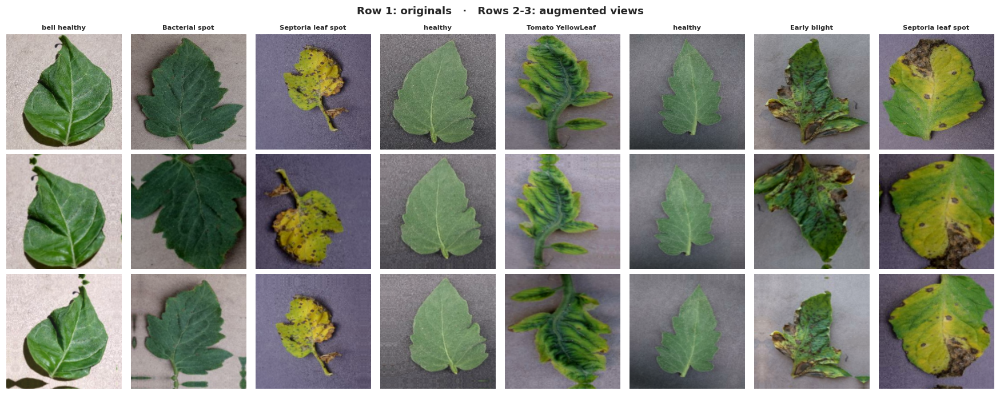

In [16]:
# Visual sanity check on augmentation — the labels must still be readable after it
fig, axes = plt.subplots(3, 8, figsize=(16, 6.4))
raw_ds = make_dataset(train_df.sample(64, random_state=CFG.SEED), training=False, augment=False)
raw_x, raw_y = next(iter(raw_ds))
for c in range(8):
    axes[0, c].imshow(raw_x[c].numpy().astype("uint8")); axes[0, c].axis("off")
    axes[0, c].set_title(prettify(IDX_TO_CLASS[int(tf.argmax(raw_y[c]))]).split(" · ")[-1][:18],
                         fontsize=7.5)
    for r in (1, 2):
        aug = augmenter(tf.expand_dims(raw_x[c], 0), training=True)[0]
        axes[r, c].imshow(tf.clip_by_value(aug, 0, 255).numpy().astype("uint8"))
        axes[r, c].axis("off")
axes[0, 0].set_ylabel("original");
plt.suptitle("Row 1: originals   ·   Rows 2-3: augmented views", fontsize=12, fontweight="bold")
plt.tight_layout()
savefig("08_augmentation_preview")

In [17]:
if CFG.USE_CLASS_WEIGHTS:
    cw = compute_class_weight("balanced",
                              classes=np.arange(NUM_CLASSES),
                              y=train_df.label_idx.values)
    class_weights = {i: float(w) for i, w in enumerate(cw)}
    cw_view = pd.DataFrame({"class": PRETTY, "train_images": train_df.label_idx.value_counts().sort_index().values,
                            "weight": np.round(cw, 3)}).sort_values("weight", ascending=False)
    print("Rare classes get a larger gradient contribution:")
    display(cw_view)
else:
    class_weights = None
    print("Class weights disabled.")

Rare classes get a larger gradient contribution:


,class,train_images,weight
4,Potato · healthy,106,9.079
13,Tomato · Tomato mosaic virus,261,3.687
8,Tomato · Leaf Mold,666,1.445
0,Pepper · bell Bacterial spot,698,1.379
3,Potato · Late blight,700,1.375
6,Tomato · Early blight,700,1.375
2,Potato · Early blight,700,1.375
11,Tomato · Target Spot,983,0.979
1,Pepper · bell healthy,1035,0.930
14,Tomato · healthy,1109,0.868


<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">6 · Models</div>

Both architectures from the source notebook are kept, unchanged in shape:

**Model A — custom CNN.** Six VGG-style blocks (64→64, 128→128, 128→128, 256→256, 512→512, 512→512), BatchNorm after each pair, max-pooling between blocks, then `Dense(256) → Dense(64) → Dropout(0.3) → softmax`. Optimiser Adamax @ 1e-3, exactly as in the original. The only edits: the classifier width now follows the data instead of being pinned at 38, and rescaling is a layer rather than a generator argument.

**Model B — EfficientNetB3.** ImageNet weights, `include_top=False`, `pooling='max'`, then `Dense(256) → Dropout(0.3) → softmax` — the original head. Training is split into two stages instead of one:

1. **Head-only** (backbone frozen, lr 1e-3) — lets the new classifier settle without wrecking pretrained features with large early gradients.
2. **Fine-tune** (top ~60 layers unfrozen, lr 1e-5, BatchNorm kept frozen) — adapts high-level features to leaves.

Unfreezing everything at 1e-3 from step one, as the original did, works on a dataset this easy but is the main reason such runs are unstable on harder data.

In [18]:
def make_callbacks(tag, monitor="val_loss"):
    return [
        keras.callbacks.EarlyStopping(monitor=monitor, patience=CFG.PATIENCE,
                                      restore_best_weights=True, verbose=1),
        keras.callbacks.ReduceLROnPlateau(monitor=monitor, factor=0.5, patience=3,
                                          min_lr=1e-7, verbose=1),
        keras.callbacks.ModelCheckpoint(str(CFG.OUT_DIR / "models" / f"{tag}_best.keras"),
                                        monitor=monitor, save_best_only=True, verbose=0),
        keras.callbacks.CSVLogger(str(CFG.OUT_DIR / "logs" / f"{tag}_history.csv"), append=True),
    ]

METRICS = [
    keras.metrics.CategoricalAccuracy(name="accuracy"),
    keras.metrics.TopKCategoricalAccuracy(k=3, name="top3"),
]

def merge_history(*histories):
    out = {}
    for h in histories:
        hd = h.history if hasattr(h, "history") else h
        for k, v in hd.items():
            out.setdefault(k, []).extend(list(v))
    return out

histories, models, timings = {}, {}, {}

In [19]:
def build_scratch_cnn(num_classes=NUM_CLASSES, img_size=CFG.IMG_SIZE):
    """The source notebook's CNN, rebuilt functionally with in-graph rescaling."""
    inputs = keras.Input(shape=(img_size, img_size, 3), name="image_uint8_range")
    x = layers.Rescaling(1.0 / 255, name="rescale")(inputs)

    for filters in [64, 128, 128, 256, 512, 512]:
        x = layers.Conv2D(filters, 3, padding="same", activation="relu")(x)
        x = layers.Conv2D(filters, 3, padding="same", activation="relu")(x)
        x = layers.BatchNormalization()(x)
        x = layers.MaxPooling2D(2)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dense(64, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)
    return keras.Model(inputs, outputs, name="scratch_cnn")

cnn = build_scratch_cnn()
cnn.compile(optimizer=keras.optimizers.Adamax(learning_rate=CFG.LR_SCRATCH),
            loss=keras.losses.CategoricalCrossentropy(label_smoothing=CFG.LABEL_SMOOTHING),
            metrics=METRICS)
cnn.summary()
print(f"\nTrainable parameters: {cnn.count_params():,}")

Model: "scratch_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_uint8_range (InputLayer)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescale (Rescaling)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 14, 14, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 14, 14, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 10,903,887 (41.60 MB)

 Trainable params: 10,900,687 (41.58 MB)

 Non-trainable params: 3,200 (12.50 KB)


Trainable parameters: 10,903,887


In [20]:
if CFG.TRAIN_SCRATCH_CNN:
    t0 = time.time()
    h_cnn = cnn.fit(train_ds, validation_data=val_ds, epochs=CFG.EPOCHS_SCRATCH,
                    callbacks=make_callbacks("scratch_cnn"),
                    class_weight=class_weights, verbose=1)
    timings["Custom CNN"] = time.time() - t0
    histories["Custom CNN"] = merge_history(h_cnn)
    models["Custom CNN"] = cnn
    print(f"\nTrained in {timings['Custom CNN']/60:.1f} min "
          f"({len(histories['Custom CNN']['loss'])} epochs run)")
else:
    print("Skipped (CFG.TRAIN_SCRATCH_CNN = False)")

Epoch 1/30
452/452 ━━━━━━━━━━━━━━━━━━━━ 348s 682ms/step - accuracy: 0.2572 - loss: 2.3465 - top3: 0.4931 - val_accuracy: 0.0659 - val_loss: 4.1963 - val_top3: 0.2521 - learning_rate: 0.0010
Epoch 2/30
452/452 ━━━━━━━━━━━━━━━━━━━━ 305s 586ms/step - accuracy: 0.4913 - loss: 1.7016 - top3: 0.7722 - val_accuracy: 0.5016 - val_loss: 1.8019 - val_top3: 0.7243 - learning_rate: 0.0010
Epoch 3/30
452/452 ━━━━━━━━━━━━━━━━━━━━ 269s 594ms/step - accuracy: 0.6286 - loss: 1.3225 - top3: 0.8813 - val_accuracy: 0.6109 - val_loss: 1.3125 - val_top3: 0.8966 - learning_rate: 0.0010
Epoch 4/30
452/452 ━━━━━━━━━━━━━━━━━━━━ 265s 584ms/step - accuracy: 0.7145 - loss: 1.1275 - top3: 0.9156 - val_accuracy: 0.7644 - val_loss: 1.0186 - val_top3: 0.9421 - learning_rate: 0.0010
Epoch 5/30
452/452 ━━━━━━━━━━━━━━━━━━━━ 265s 583ms/step - accuracy: 0.7768 - loss: 0.9780 - top3: 0.9421 - val_accuracy: 0.6422 - val_loss: 1.2257 - val_top3: 0.9114 - learning_rate: 0.0010
Epoch 6/30
452/452 ━━━━━━━━━━━━━━━━━━━━ 318s 576ms

In [21]:
def build_efficientnet(num_classes=NUM_CLASSES, img_size=CFG.IMG_SIZE):
    """EfficientNetB3 backbone + the source notebook's head. Expects [0,255] inputs."""
    base = keras.applications.EfficientNetB3(
        include_top=False, weights="imagenet",
        input_shape=(img_size, img_size, 3), pooling="max")
    base.trainable = False                       # stage 1: head only

    inputs = keras.Input(shape=(img_size, img_size, 3), name="image_uint8_range")
    x = base(inputs, training=False)             # keeps BatchNorm in inference mode
    x = layers.Dense(256, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax", dtype="float32", name="predictions")(x)
    return keras.Model(inputs, outputs, name="efficientnetb3"), base

if CFG.TRAIN_EFFICIENTNET:
    effnet, backbone = build_efficientnet()
    effnet.compile(optimizer=keras.optimizers.Adamax(learning_rate=CFG.LR_HEAD),
                   loss=keras.losses.CategoricalCrossentropy(label_smoothing=CFG.LABEL_SMOOTHING),
                   metrics=METRICS)
    print(f"Backbone layers: {len(backbone.layers)} | "
          f"trainable params (stage 1): {sum(np.prod(v.shape) for v in effnet.trainable_weights):,}")
    effnet.summary()

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Backbone layers: 386 | trainable params (stage 1): 397,327


Model: "efficientnetb3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image_uint8_range (InputLayer)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb3 (Functional)     │ (None, 1536)           │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       393,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 15)             │         3,855 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,180,862 (42.65 MB)

 Trainable params: 397,327 (1.52 MB)

 Non-trainable params: 10,783,535 (41.14 MB)

In [22]:
if CFG.TRAIN_EFFICIENTNET:
    print("=" * 70, "\nSTAGE 1 — frozen backbone, training the head\n", "=" * 70, sep="")
    t0 = time.time()
    h_head = effnet.fit(train_ds, validation_data=val_ds, epochs=CFG.EPOCHS_HEAD,
                        callbacks=make_callbacks("effnet_head"),
                        class_weight=class_weights, verbose=1)
    stage1_time = time.time() - t0

STAGE 1 — frozen backbone, training the head
Epoch 1/8
452/452 ━━━━━━━━━━━━━━━━━━━━ 311s 584ms/step - accuracy: 0.4837 - loss: 2.1310 - top3: 0.7050 - val_accuracy: 0.5889 - val_loss: 1.4365 - val_top3: 0.8352 - learning_rate: 0.0010
Epoch 2/8
452/452 ━━━━━━━━━━━━━━━━━━━━ 213s 470ms/step - accuracy: 0.5819 - loss: 1.4461 - top3: 0.8345 - val_accuracy: 0.6978 - val_loss: 1.1515 - val_top3: 0.9121 - learning_rate: 0.0010
Epoch 3/8
452/452 ━━━━━━━━━━━━━━━━━━━━ 214s 472ms/step - accuracy: 0.6588 - loss: 1.2367 - top3: 0.8878 - val_accuracy: 0.7204 - val_loss: 1.0921 - val_top3: 0.9118 - learning_rate: 0.0010
Epoch 4/8
452/452 ━━━━━━━━━━━━━━━━━━━━ 262s 472ms/step - accuracy: 0.7019 - loss: 1.1436 - top3: 0.9077 - val_accuracy: 0.7877 - val_loss: 0.9450 - val_top3: 0.9434 - learning_rate: 0.0010
Epoch 5/8
452/452 ━━━━━━━━━━━━━━━━━━━━ 217s 479ms/step - accuracy: 0.7289 - loss: 1.0563 - top3: 0.9265 - val_accuracy: 0.7770 - val_loss: 0.9597 - val_top3: 0.9392 - learning_rate: 0.0010
Epoch 6/8


In [23]:
if CFG.TRAIN_EFFICIENTNET:
    print("=" * 70, "\nSTAGE 2 — fine-tuning the top of the backbone\n", "=" * 70, sep="")
    backbone.trainable = True
    for l in backbone.layers[:-CFG.FINETUNE_LAST_N]:
        l.trainable = False
    for l in backbone.layers:                       # BatchNorm stays frozen while fine-tuning
        if isinstance(l, layers.BatchNormalization):
            l.trainable = False

    effnet.compile(optimizer=keras.optimizers.Adamax(learning_rate=CFG.LR_FINETUNE),
                   loss=keras.losses.CategoricalCrossentropy(label_smoothing=CFG.LABEL_SMOOTHING),
                   metrics=METRICS)
    print(f"Trainable layers now: {sum(l.trainable for l in backbone.layers)}/{len(backbone.layers)}"
          f" | trainable params: {sum(np.prod(v.shape) for v in effnet.trainable_weights):,}")

    t0 = time.time()
    h_ft = effnet.fit(train_ds, validation_data=val_ds, epochs=CFG.EPOCHS_FINETUNE,
                      callbacks=make_callbacks("effnet_finetune"),
                      class_weight=class_weights, verbose=1)
    timings["EfficientNetB3"] = stage1_time + (time.time() - t0)
    histories["EfficientNetB3"] = merge_history(h_head, h_ft)
    models["EfficientNetB3"] = effnet
    FINETUNE_START = len(h_head.history["loss"])     # epoch index where stage 2 begins
    print(f"\nTotal EfficientNetB3 training: {timings['EfficientNetB3']/60:.1f} min")

with open(CFG.OUT_DIR / "logs" / "histories.json", "w") as f:
    json.dump({k: {m: [float(x) for x in v] for m, v in h.items()} for k, h in histories.items()},
              f, indent=2)
print("Histories saved →", CFG.OUT_DIR / "logs" / "histories.json")

STAGE 2 — fine-tuning the top of the backbone
Trainable layers now: 48/386 | trainable params: 5,619,325
Epoch 1/7
452/452 ━━━━━━━━━━━━━━━━━━━━ 294s 554ms/step - accuracy: 0.8017 - loss: 0.8860 - top3: 0.9558 - val_accuracy: 0.8410 - val_loss: 0.8070 - val_top3: 0.9664 - learning_rate: 1.0000e-05
Epoch 2/7
452/452 ━━━━━━━━━━━━━━━━━━━━ 214s 471ms/step - accuracy: 0.8188 - loss: 0.8518 - top3: 0.9604 - val_accuracy: 0.8497 - val_loss: 0.7888 - val_top3: 0.9677 - learning_rate: 1.0000e-05
Epoch 3/7
452/452 ━━━━━━━━━━━━━━━━━━━━ 263s 472ms/step - accuracy: 0.8241 - loss: 0.8351 - top3: 0.9645 - val_accuracy: 0.8546 - val_loss: 0.7848 - val_top3: 0.9693 - learning_rate: 1.0000e-05
Epoch 4/7
452/452 ━━━━━━━━━━━━━━━━━━━━ 262s 474ms/step - accuracy: 0.8310 - loss: 0.8167 - top3: 0.9688 - val_accuracy: 0.8597 - val_loss: 0.7705 - val_top3: 0.9699 - learning_rate: 1.0000e-05
Epoch 5/7
452/452 ━━━━━━━━━━━━━━━━━━━━ 219s 483ms/step - accuracy: 0.8377 - loss: 0.7975 - top3: 0.9708 - val_accuracy: 0.8

<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">7 · Learning Curves</div>

Four things to read off these: does validation track training (fit quality), does the gap widen (overfitting), does the curve flatten (converged), and does the loss spike after unfreezing (learning rate too high for fine-tuning).

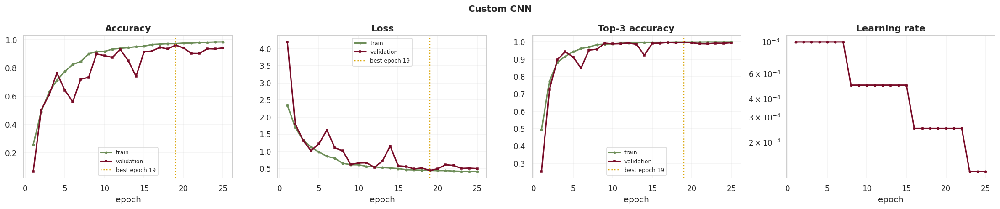

Custom CNN: final train-val accuracy gap = +4.20 pp (overfitting)


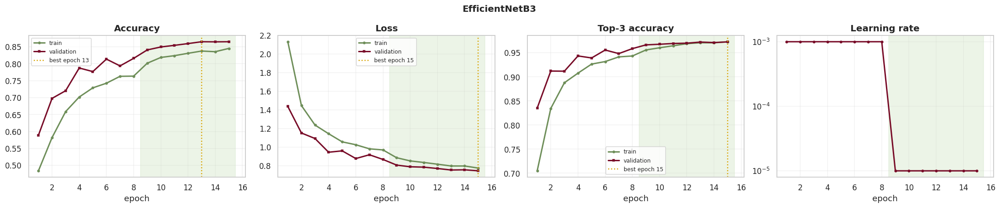

EfficientNetB3: final train-val accuracy gap = -1.98 pp (healthy)

Shaded region = stage 2 (fine-tuning). A loss spike there means LR_FINETUNE is too high.


In [24]:
def plot_curves(hist, title, finetune_epoch=None):
    ep = np.arange(1, len(hist["loss"]) + 1)
    keys = [k for k in ["accuracy", "loss", "top3"] if k in hist]
    if "lr" in hist or "learning_rate" in hist:
        keys.append("lr" if "lr" in hist else "learning_rate")
    fig, axes = plt.subplots(1, len(keys), figsize=(5.0 * len(keys), 4.2))
    axes = np.atleast_1d(axes)
    for ax, k in zip(axes, keys):
        if k in ("lr", "learning_rate"):
            ax.plot(ep, hist[k], color="#780C28", lw=2, marker="o", ms=3)
            ax.set_yscale("log"); ax.set(title="Learning rate", xlabel="epoch")
        else:
            ax.plot(ep, hist[k], label="train", color="#6E8E59", lw=2, marker="o", ms=3)
            if f"val_{k}" in hist:
                ax.plot(ep, hist[f"val_{k}"], label="validation", color="#780C28",
                        lw=2, marker="s", ms=3)
                best = int(np.argmin(hist["val_loss"])) if k == "loss" else int(np.argmax(hist[f"val_{k}"]))
                ax.axvline(best + 1, color="#D9A404", ls=":", lw=1.6,
                           label=f"best epoch {best+1}")
            ax.set(title=k.replace("top3", "top-3 accuracy").capitalize(), xlabel="epoch")
            ax.legend(fontsize=8)
        if finetune_epoch:
            ax.axvspan(finetune_epoch + 0.5, len(ep) + 0.5, color="#CAE0BC", alpha=0.35)
    plt.suptitle(title, fontsize=13, fontweight="bold")
    plt.tight_layout()
    savefig(f"09_curves_{title.lower().replace(' ', '_')}")

for name, hist in histories.items():
    ft = FINETUNE_START if (name == "EfficientNetB3" and "FINETUNE_START" in globals()) else None
    plot_curves(hist, name, finetune_epoch=ft)
    gap = hist["accuracy"][-1] - hist.get("val_accuracy", hist["accuracy"])[-1]
    print(f"{name}: final train-val accuracy gap = {gap*100:+.2f} pp "
          f"({'overfitting' if gap > 0.03 else 'healthy'})")
if "EfficientNetB3" in histories and "FINETUNE_START" in globals():
    print("\nShaded region = stage 2 (fine-tuning). A loss spike there means LR_FINETUNE is too high.")

<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">8 · Evaluation on the Held-Out Test Set</div>

Metrics reported, and why each one is here:

| Metric | Why |
|---|---|
| **Accuracy** | headline number, but flattered by class imbalance |
| **Balanced accuracy** | mean per-class recall — the honest version of accuracy here |
| **Macro F1** | treats a 152-image class as equal to a 3,200-image one |
| **Weighted F1** | reflects the population a deployed model would actually meet |
| **Top-3 accuracy** | for a UI that surfaces three candidate diagnoses to a farmer |
| **Cohen's κ / MCC** | agreement corrected for chance; MCC is robust under skew |
| **ROC-AUC / PR-AUC** (OvR) | threshold-free ranking quality; PR-AUC is the informative one for rare classes |
| **Log loss** | confidence calibration — a confidently wrong model scores badly |

In [25]:
def evaluate(model, frame, ds, name):
    t0 = time.time()
    probs = model.predict(ds, verbose=0)
    infer_s = time.time() - t0
    y_true = frame.label_idx.values
    y_pred = probs.argmax(1)
    y_bin = label_binarize(y_true, classes=np.arange(NUM_CLASSES))

    p_ma, r_ma, f_ma, _ = precision_recall_fscore_support(y_true, y_pred, average="macro", zero_division=0)
    p_w,  r_w,  f_w,  _ = precision_recall_fscore_support(y_true, y_pred, average="weighted", zero_division=0)
    res = {
        "model": name,
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "precision_macro": p_ma, "recall_macro": r_ma, "f1_macro": f_ma,
        "precision_weighted": p_w, "recall_weighted": r_w, "f1_weighted": f_w,
        "top3_accuracy": top_k_accuracy_score(y_true, probs, k=3, labels=np.arange(NUM_CLASSES)),
        "cohen_kappa": cohen_kappa_score(y_true, y_pred),
        "mcc": matthews_corrcoef(y_true, y_pred),
        "log_loss": log_loss(y_true, probs, labels=np.arange(NUM_CLASSES)),
        "roc_auc_macro": roc_auc_score(y_bin, probs, average="macro", multi_class="ovr"),
        "roc_auc_micro": roc_auc_score(y_bin.ravel(), probs.ravel()),
        "pr_auc_macro": average_precision_score(y_bin, probs, average="macro"),
        "mean_confidence": float(probs.max(1).mean()),
        "predict_seconds": infer_s,
        "ms_per_image": infer_s / len(frame) * 1000,
    }
    return res, probs, y_true, y_pred

results, preds_store = {}, {}
for name, model in models.items():
    print(f"Evaluating {name} on {len(test_df):,} unseen test images…")
    res, probs, y_true, y_pred = evaluate(model, test_df, test_ds, name)
    results[name] = res
    preds_store[name] = (probs, y_true, y_pred)
    print(f"  accuracy {res['accuracy']*100:.2f}% | balanced {res['balanced_accuracy']*100:.2f}% "
          f"| macro-F1 {res['f1_macro']*100:.2f}% | top-3 {res['top3_accuracy']*100:.2f}%")

res_df = pd.DataFrame(results).T
BEST = res_df.f1_macro.astype(float).idxmax()
print(f"\nBest model by macro-F1 → {BEST}")
res_df.drop(columns=["model"]).astype(float).round(4).T

Evaluating Custom CNN on 3,094 unseen test images…
  accuracy 95.51% | balanced 94.86% | macro-F1 94.59% | top-3 99.81%
Evaluating EfficientNetB3 on 3,094 unseen test images…
  accuracy 87.10% | balanced 88.06% | macro-F1 86.92% | top-3 97.41%

Best model by macro-F1 → Custom CNN


,Custom CNN,EfficientNetB3
accuracy,0.9551,0.8710
balanced_accuracy,0.9486,0.8806
precision_macro,0.9488,0.8666
recall_macro,0.9486,0.8806
f1_macro,0.9459,0.8692
precision_weighted,0.9580,0.8809
recall_weighted,0.9551,0.8710
f1_weighted,0.9552,0.8712
top3_accuracy,0.9981,0.9741
cohen_kappa,0.9509,0.8594


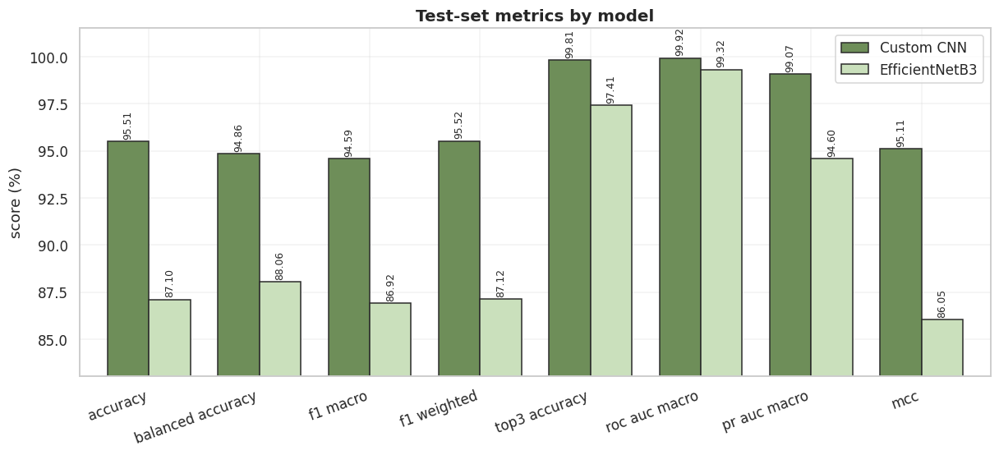

In [26]:
metric_cols = ["accuracy", "balanced_accuracy", "f1_macro", "f1_weighted",
               "top3_accuracy", "roc_auc_macro", "pr_auc_macro", "mcc"]
plot_df = res_df[metric_cols].astype(float) * 100
fig, ax = plt.subplots(figsize=(13, 5))
plot_df.T.plot(kind="bar", ax=ax, color=PALETTE[:len(plot_df)], edgecolor="#2b2b2b", width=0.75)
for cont in ax.containers:
    ax.bar_label(cont, fmt="%.2f", fontsize=8, padding=2, rotation=90)
ax.set(ylim=(min(85, plot_df.values.min() - 3), 101.5), ylabel="score (%)",
       title="Test-set metrics by model")
ax.set_xticklabels([c.replace("_", " ") for c in metric_cols], rotation=20, ha="right")
ax.legend(title="")
savefig("10_metric_comparison")

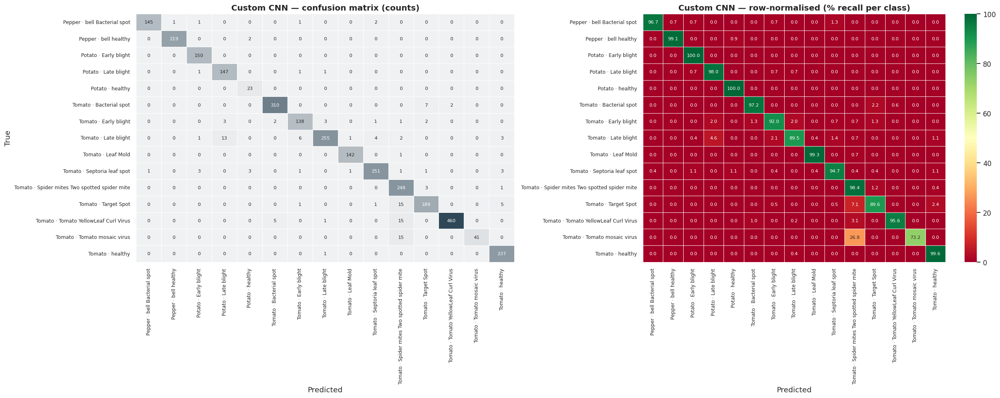


Custom CNN — most frequent confusions:
    15 × Tomato · Tomato mosaic virus  →  Tomato · Spider mites Two spotted spider mite
    15 × Tomato · Target Spot  →  Tomato · Spider mites Two spotted spider mite
    15 × Tomato · Tomato YellowLeaf Curl Virus  →  Tomato · Spider mites Two spotted spider mite
    13 × Tomato · Late blight  →  Potato · Late blight
     7 × Tomato · Bacterial spot  →  Tomato · Target Spot
     6 × Tomato · Late blight  →  Tomato · Early blight
     5 × Tomato · Tomato YellowLeaf Curl Virus  →  Tomato · Bacterial spot
     5 × Tomato · Target Spot  →  Tomato · healthy


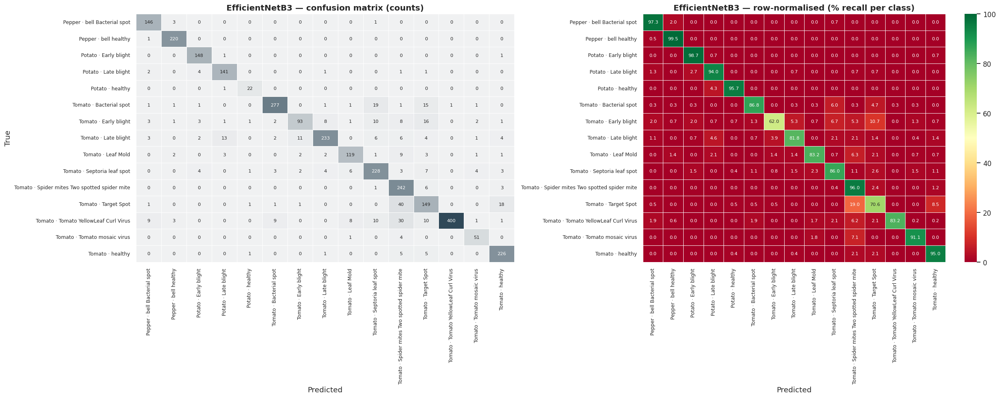


EfficientNetB3 — most frequent confusions:
    40 × Tomato · Target Spot  →  Tomato · Spider mites Two spotted spider mite
    30 × Tomato · Tomato YellowLeaf Curl Virus  →  Tomato · Spider mites Two spotted spider mite
    19 × Tomato · Bacterial spot  →  Tomato · Septoria leaf spot
    18 × Tomato · Target Spot  →  Tomato · healthy
    16 × Tomato · Early blight  →  Tomato · Target Spot
    15 × Tomato · Bacterial spot  →  Tomato · Target Spot
    13 × Tomato · Late blight  →  Potato · Late blight
    11 × Tomato · Late blight  →  Tomato · Early blight


In [27]:
def plot_confusions(y_true, y_pred, name):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(NUM_CLASSES))
    cmn = cm.astype(float) / np.maximum(cm.sum(1, keepdims=True), 1)
    fig, axes = plt.subplots(1, 2, figsize=(23, 9))
    sns.heatmap(cm, annot=True, fmt="d", cmap=GREEN_CMAP, cbar=False,
                xticklabels=PRETTY, yticklabels=PRETTY, ax=axes[0],
                linewidths=0.4, linecolor="white", annot_kws={"size": 7.5})
    axes[0].set(title=f"{name} — confusion matrix (counts)", xlabel="Predicted", ylabel="True")
    sns.heatmap(cmn * 100, annot=True, fmt=".1f", cmap="RdYlGn", vmin=0, vmax=100, cbar=True,
                xticklabels=PRETTY, yticklabels=PRETTY, ax=axes[1],
                linewidths=0.4, linecolor="white", annot_kws={"size": 7.5})
    axes[1].set(title=f"{name} — row-normalised (% recall per class)", xlabel="Predicted", ylabel="")
    for ax in axes:
        ax.tick_params(axis="x", rotation=90, labelsize=8)
        ax.tick_params(axis="y", rotation=0, labelsize=8)
    plt.tight_layout()
    savefig(f"11_confusion_{name.lower().replace(' ', '_')}")

    off = cm.copy(); np.fill_diagonal(off, 0)
    pairs = [(PRETTY[i], PRETTY[j], off[i, j])
             for i, j in zip(*np.unravel_index(np.argsort(off, axis=None)[::-1][:8], off.shape))
             if off[i, j] > 0]
    if pairs:
        print(f"\n{name} — most frequent confusions:")
        for t, p, n in pairs:
            print(f"  {n:>4} × {t}  →  {p}")

for name, (_, y_true, y_pred) in preds_store.items():
    plot_confusions(y_true, y_pred, name)

                                               precision    recall  f1-score   support

                 Pepper · bell Bacterial spot     0.9932    0.9667    0.9797       150
                        Pepper · bell healthy     0.9955    0.9910    0.9932       221
                        Potato · Early blight     0.9615    1.0000    0.9804       150
                         Potato · Late blight     0.9018    0.9800    0.9393       150
                             Potato · healthy     0.8214    1.0000    0.9020        23
                      Tomato · Bacterial spot     0.9779    0.9718    0.9748       319
                        Tomato · Early blight     0.9324    0.9200    0.9262       150
                         Tomato · Late blight     0.9770    0.8947    0.9341       285
                           Tomato · Leaf Mold     0.9861    0.9930    0.9895       143
                  Tomato · Septoria leaf spot     0.9691    0.9472    0.9580       265
Tomato · Spider mites Two spotted spider m

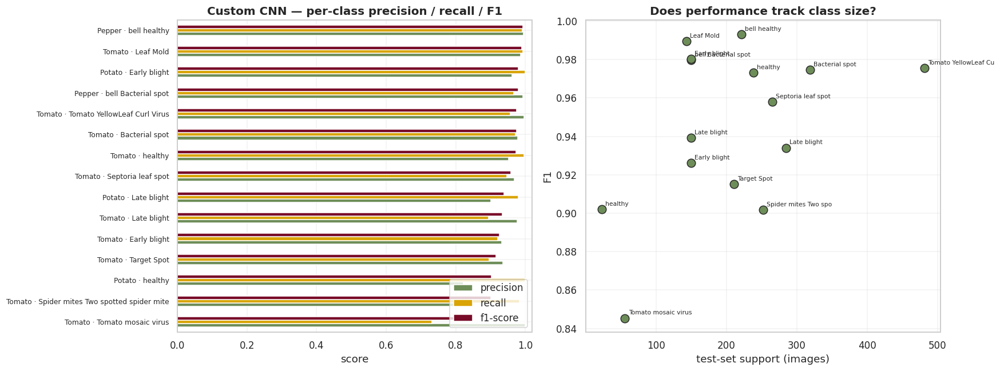

In [28]:
probs, y_true, y_pred = preds_store[BEST]
report = classification_report(y_true, y_pred, target_names=PRETTY,
                               digits=4, zero_division=0, output_dict=True)
rep_df = pd.DataFrame(report).T
rep_df.to_csv(CFG.OUT_DIR / f"classification_report_{BEST.replace(' ', '_')}.csv")
print(classification_report(y_true, y_pred, target_names=PRETTY, digits=4, zero_division=0))

per_class = rep_df.loc[PRETTY, ["precision", "recall", "f1-score", "support"]].sort_values("f1-score")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
per_class[["precision", "recall", "f1-score"]].plot(
    kind="barh", ax=axes[0], color=["#6E8E59", "#D9A404", "#780C28"], edgecolor="white")
axes[0].set(title=f"{BEST} — per-class precision / recall / F1", xlim=(0, 1.02), xlabel="score")
axes[0].tick_params(axis="y", labelsize=8)

axes[1].scatter(per_class["support"], per_class["f1-score"], s=90, color="#6E8E59",
                edgecolor="#2b2b2b", zorder=3)
for lbl, row in per_class.iterrows():
    axes[1].annotate(lbl.split(" · ")[-1][:20], (row["support"], row["f1-score"]),
                     fontsize=7, xytext=(4, 4), textcoords="offset points")
axes[1].set(xlabel="test-set support (images)", ylabel="F1",
            title="Does performance track class size?")
plt.tight_layout()
savefig("12_per_class_metrics")

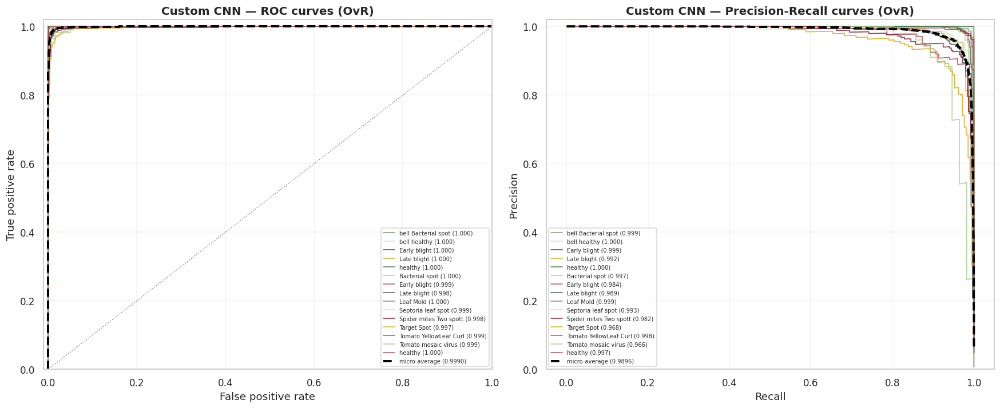

In [29]:
# ROC and Precision-Recall curves (one-vs-rest)
y_bin = label_binarize(y_true, classes=np.arange(NUM_CLASSES))
fig, axes = plt.subplots(1, 2, figsize=(16, 6.6))

fpr, tpr, roc_auc = {}, {}, {}
for i in range(NUM_CLASSES):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    axes[0].plot(fpr[i], tpr[i], lw=1.1, alpha=0.8,
                 label=f"{PRETTY[i].split(' · ')[-1][:22]} ({roc_auc[i]:.3f})")
fpr_mi, tpr_mi, _ = roc_curve(y_bin.ravel(), probs.ravel())
axes[0].plot(fpr_mi, tpr_mi, lw=2.6, color="black", ls="--",
             label=f"micro-average ({auc(fpr_mi, tpr_mi):.4f})")
axes[0].plot([0, 1], [0, 1], color="grey", lw=1, ls=":")
axes[0].set(xlabel="False positive rate", ylabel="True positive rate",
            title=f"{BEST} — ROC curves (OvR)", xlim=(-0.01, 1.0), ylim=(0, 1.02))
axes[0].legend(fontsize=6.5, loc="lower right", ncol=1)

for i in range(NUM_CLASSES):
    pr, rc, _ = precision_recall_curve(y_bin[:, i], probs[:, i])
    ap = average_precision_score(y_bin[:, i], probs[:, i])
    axes[1].plot(rc, pr, lw=1.1, alpha=0.8,
                 label=f"{PRETTY[i].split(' · ')[-1][:22]} ({ap:.3f})")
pr_mi, rc_mi, _ = precision_recall_curve(y_bin.ravel(), probs.ravel())
axes[1].plot(rc_mi, pr_mi, lw=2.6, color="black", ls="--",
             label=f"micro-average ({average_precision_score(y_bin, probs, average='micro'):.4f})")
axes[1].set(xlabel="Recall", ylabel="Precision", title=f"{BEST} — Precision-Recall curves (OvR)",
            ylim=(0, 1.02))
axes[1].legend(fontsize=6.5, loc="lower left")
plt.tight_layout()
savefig("13_roc_pr_curves")

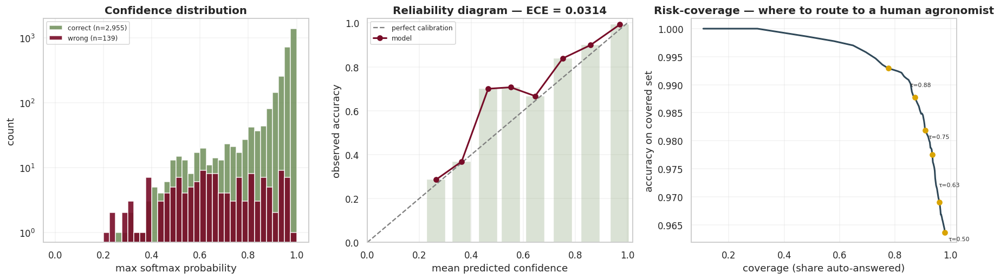

Expected Calibration Error: 0.0314 (lower is better; <0.05 is usually fine for a UI)
Mean confidence when correct 0.936 · when wrong 0.664


In [30]:
# Confidence behaviour and calibration
conf = probs.max(1)
correct = (y_pred == y_true)
fig, axes = plt.subplots(1, 3, figsize=(16.5, 4.8))

edges = np.linspace(0, 1, 41)          # explicit edges: safe when a group is empty
axes[0].hist(conf[correct], bins=edges, alpha=0.85, color="#6E8E59",
             label=f"correct (n={correct.sum():,})")
axes[0].hist(conf[~correct], bins=edges, alpha=0.9, color="#780C28",
             label=f"wrong (n={(~correct).sum():,})")
axes[0].set(xlabel="max softmax probability", ylabel="count", title="Confidence distribution", yscale="log")
axes[0].legend(fontsize=8)

bins = np.linspace(0, 1, 11)
idx = np.digitize(conf, bins) - 1
acc_b, conf_b, cnt_b = [], [], []
for b in range(10):
    m = idx == b
    if m.sum() > 0:
        acc_b.append(correct[m].mean()); conf_b.append(conf[m].mean()); cnt_b.append(m.sum())
ece = float(np.sum(np.array(cnt_b) / len(conf) * np.abs(np.array(acc_b) - np.array(conf_b))))
axes[1].plot([0, 1], [0, 1], ls="--", color="grey", label="perfect calibration")
axes[1].plot(conf_b, acc_b, marker="o", lw=2, color="#780C28", label="model")
axes[1].bar(conf_b, acc_b, width=0.07, alpha=0.25, color="#6E8E59")
axes[1].set(xlabel="mean predicted confidence", ylabel="observed accuracy",
            title=f"Reliability diagram — ECE = {ece:.4f}", xlim=(0, 1.02), ylim=(0, 1.02))
axes[1].legend(fontsize=8)

ths = np.linspace(0.5, 0.999, 60)
cov = [(conf >= t).mean() for t in ths]
sel_acc = [correct[conf >= t].mean() if (conf >= t).sum() else np.nan for t in ths]
axes[2].plot(cov, sel_acc, color="#2F4858", lw=2)
axes[2].scatter(cov[::10], sel_acc[::10], color="#D9A404", zorder=3)
for c_, a_, t_ in zip(cov[::15], sel_acc[::15], ths[::15]):
    axes[2].annotate(f"τ={t_:.2f}", (c_, a_), fontsize=7, xytext=(4, -10), textcoords="offset points")
axes[2].set(xlabel="coverage (share auto-answered)", ylabel="accuracy on covered set",
            title="Risk-coverage — where to route to a human agronomist")
plt.tight_layout()
savefig("14_confidence_calibration")
print(f"Expected Calibration Error: {ece:.4f} (lower is better; <0.05 is usually fine for a UI)")
print(f"Mean confidence when correct {conf[correct].mean():.3f} · when wrong {conf[~correct].mean():.3f}")

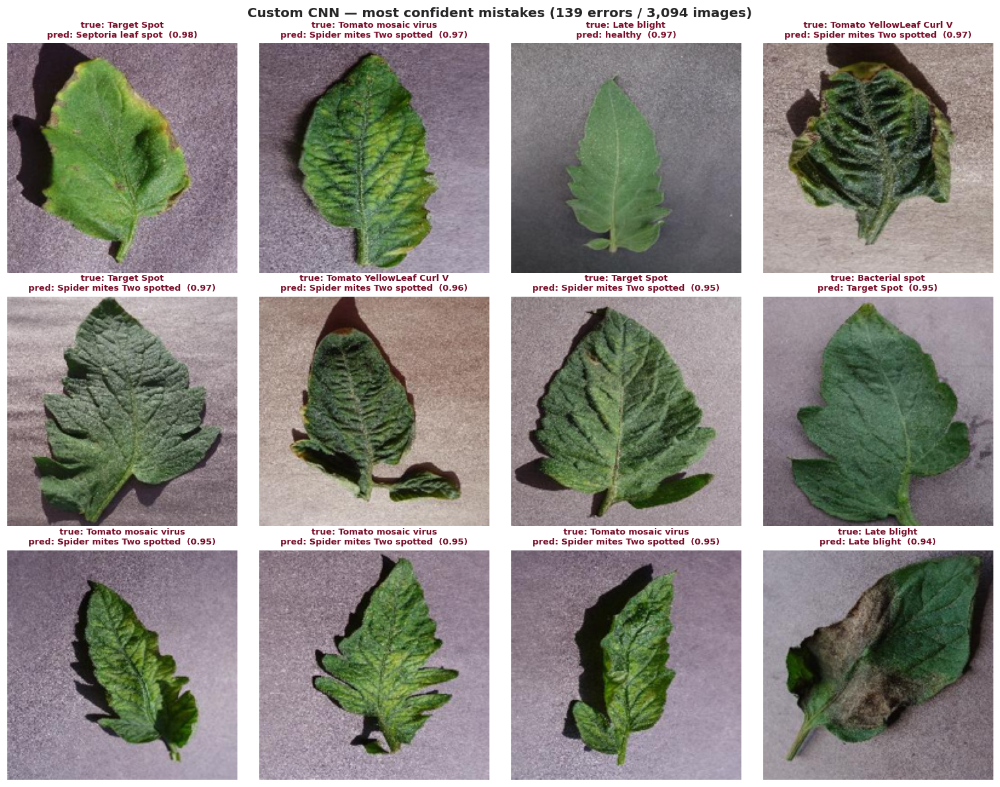

In [31]:
# Error gallery — the images the model got wrong, ranked by confidence
wrong_idx = np.where(~correct)[0]
if len(wrong_idx):
    order = wrong_idx[np.argsort(conf[wrong_idx])[::-1]][:12]      # most confidently wrong first
    fig, axes = plt.subplots(3, 4, figsize=(14, 11))
    for ax, i in zip(axes.flat, order):
        ax.imshow(Image.open(test_df.filepath.iloc[i]).resize((190, 190))); ax.axis("off")
        ax.set_title(f"true: {PRETTY[y_true[i]].split(' · ')[-1][:24]}\n"
                     f"pred: {PRETTY[y_pred[i]].split(' · ')[-1][:24]}  ({conf[i]:.2f})",
                     fontsize=8.5, color="#780C28")
    for ax in axes.flat[len(order):]:
        ax.axis("off")
    plt.suptitle(f"{BEST} — most confident mistakes ({len(wrong_idx)} errors / {len(test_df):,} images)",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    savefig("15_error_gallery")
else:
    print("No misclassifications on the test set.")

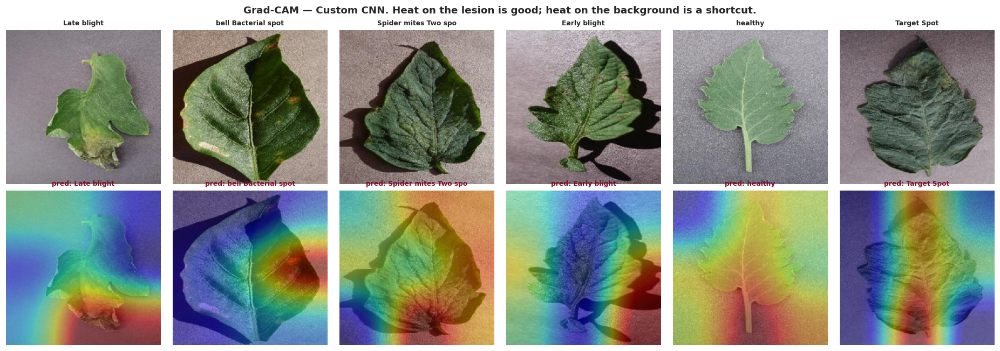

In [32]:
# Grad-CAM — is the model looking at the lesion or at the background?
def _last_conv(m):
    return next(l for l in reversed(m.layers)
                if hasattr(l, "output") and len(l.output.shape) == 4)

def gradcam(model, img_array, class_idx=None):
    nested = next((l for l in model.layers if isinstance(l, keras.Model)), None)
    if nested is None:                                   # plain stack (custom CNN)
        grad_model = keras.Model(model.inputs, [_last_conv(model).output, model.output])
        with tf.GradientTape() as tape:
            conv_out, out = grad_model(img_array)
            class_idx = int(tf.argmax(out[0])) if class_idx is None else class_idx
            loss = out[:, class_idx]
    else:                                                # nested backbone (EfficientNet)
        head = model.layers[model.layers.index(nested) + 1:]
        feat_model = keras.Model(nested.inputs, [_last_conv(nested).output, nested.output])
        with tf.GradientTape() as tape:
            conv_out, feats = feat_model(img_array)
            out = feats
            for l in head:
                out = l(out)
            class_idx = int(tf.argmax(out[0])) if class_idx is None else class_idx
            loss = out[:, class_idx]
    grads = tape.gradient(loss, conv_out)
    weights = tf.reduce_mean(grads, axis=(0, 1, 2))
    cam = tf.reduce_sum(conv_out[0] * weights, axis=-1)
    cam = tf.maximum(cam, 0) / (tf.reduce_max(cam) + 1e-8)
    return cam.numpy(), class_idx

try:
    show = test_df.sample(6, random_state=CFG.SEED)
    fig, axes = plt.subplots(2, 6, figsize=(17, 6))
    for c, (_, row) in enumerate(show.iterrows()):
        img = np.array(Image.open(row.filepath).convert("RGB").resize((CFG.IMG_SIZE, CFG.IMG_SIZE)))
        arr = tf.convert_to_tensor(img[None].astype("float32"))
        cam, ci = gradcam(models[BEST], arr)
        cam_r = np.array(Image.fromarray((cam * 255).astype("uint8")).resize((CFG.IMG_SIZE, CFG.IMG_SIZE)))
        axes[0, c].imshow(img); axes[0, c].axis("off")
        axes[0, c].set_title(prettify(row.label).split(" · ")[-1][:20], fontsize=8)
        axes[1, c].imshow(img); axes[1, c].imshow(cam_r, cmap="jet", alpha=0.45); axes[1, c].axis("off")
        axes[1, c].set_title(f"pred: {PRETTY[ci].split(' · ')[-1][:20]}", fontsize=8, color="#780C28")
    plt.suptitle(f"Grad-CAM — {BEST}. Heat on the lesion is good; heat on the background is a shortcut.",
                 fontsize=12, fontweight="bold")
    plt.tight_layout()
    savefig("16_gradcam")
except Exception as e:
    print(f"Grad-CAM skipped ({type(e).__name__}: {e}). Not fatal — the metrics above are unaffected.")

<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">9 · Export — .keras, .h5 and TFLite</div>

Three formats, three jobs: `.keras` for further training, `.h5` for legacy/portability, `.tflite` for the phone.

Two conversion traps are handled explicitly:

- `TFLiteConverter.from_keras_model()` raises on Keras 3 models. The fallback exports a SavedModel via `model.export()` and converts from that.
- A converted model that runs is not a converted model that is *correct*. Every export is re-run on real test images and checked for agreement with the Keras model before being reported as usable.

Float16 quantisation roughly halves file size with essentially no accuracy loss and is the sensible default for an Android/Flutter deployment.

In [33]:
def save_h5(model, path):
    path = str(path)
    try:
        model.save(path)
        return True
    except Exception as e:
        print(f"    .h5 save failed ({type(e).__name__}: {e}) — saving weights instead")
        try:
            model.save_weights(str(path).replace(".h5", ".weights.h5"))
        except Exception as e2:
            print("    weight save also failed:", e2)
        return False

def _converter(model, prefer_savedmodel=False):
    if not prefer_savedmodel:
        return tf.lite.TFLiteConverter.from_keras_model(model)
    sm_dir = CFG.OUT_DIR / "models" / f"{model.name}_savedmodel"
    shutil.rmtree(sm_dir, ignore_errors=True)
    if hasattr(model, "export"):
        model.export(str(sm_dir))                       # Keras 3
    else:
        model.save(str(sm_dir), save_format="tf")       # Keras 2
    return tf.lite.TFLiteConverter.from_saved_model(str(sm_dir))

def to_tflite(model, out_path, fp16=False):
    for prefer_sm in (False, True):
        try:
            conv = _converter(model, prefer_sm)
            if fp16:
                conv.optimizations = [tf.lite.Optimize.DEFAULT]
                conv.target_spec.supported_types = [tf.float16]
            blob = conv.convert()
            Path(out_path).write_bytes(blob)
            print(f"    {'fp16' if fp16 else 'fp32'} TFLite → {Path(out_path).name} "
                  f"({len(blob)/1e6:.2f} MB, via {'SavedModel' if prefer_sm else 'Keras model'})")
            return len(blob)
        except Exception as e:
            print(f"    conversion via {'SavedModel' if prefer_sm else 'Keras model'} failed: "
                  f"{type(e).__name__}: {str(e)[:160]}")
    return None

MODEL_DIR = CFG.OUT_DIR / "models"
export_rows = []
for name, model in models.items():
    acc = results[name]["accuracy"] * 100
    slug = f"{name.lower().replace(' ', '_')}_plantvillage_acc{acc:.2f}"
    print(f"\n── {name} ──")
    model.save(str(MODEL_DIR / f"{slug}.keras"))
    print(f"    native  → {slug}.keras "
          f"({(MODEL_DIR / f'{slug}.keras').stat().st_size/1e6:.2f} MB)")
    ok_h5 = save_h5(model, str(MODEL_DIR / f"{slug}.h5"))
    if ok_h5:
        print(f"    legacy  → {slug}.h5 ({(MODEL_DIR / f'{slug}.h5').stat().st_size/1e6:.2f} MB)")
    s32 = to_tflite(model, MODEL_DIR / f"{slug}_fp32.tflite", fp16=False)
    s16 = to_tflite(model, MODEL_DIR / f"{slug}_fp16.tflite", fp16=True)
    export_rows.append({"model": name, "slug": slug,
                        "keras_MB": (MODEL_DIR / f"{slug}.keras").stat().st_size / 1e6,
                        "h5_MB": (MODEL_DIR / f"{slug}.h5").stat().st_size / 1e6 if ok_h5 else np.nan,
                        "tflite_fp32_MB": (s32 or 0) / 1e6,
                        "tflite_fp16_MB": (s16 or 0) / 1e6,
                        "params_M": model.count_params() / 1e6})

labels_payload = {"classes": CLASSES, "pretty": PRETTY, "num_classes": NUM_CLASSES,
                  "img_size": CFG.IMG_SIZE, "input_range": "[0,255] float32 RGB",
                  "note": "Normalisation is inside the model — feed raw resized pixels."}
(CFG.OUT_DIR / "labels.json").write_text(json.dumps(labels_payload, indent=2))
(MODEL_DIR / "labels.txt").write_text("\n".join(CLASSES))
export_df = pd.DataFrame(export_rows).set_index("model").round(2)
export_df


── Custom CNN ──


    native  → custom_cnn_plantvillage_acc95.51.keras (130.97 MB)
    legacy  → custom_cnn_plantvillage_acc95.51.h5 (130.99 MB)
Saved artifact at '/tmp/tmp_fcdgqrf'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='image_uint8_range')
Output Type:
  TensorSpec(shape=(None, 15), dtype=tf.float32, name=None)
Captures:
  138801120516176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120526160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120525584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120517712: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120523280: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120522896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120523472: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138801120523856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138802551028816: Tens

    native  → efficientnetb3_plantvillage_acc87.10.keras (91.05 MB)
    legacy  → efficientnetb3_plantvillage_acc87.10.h5 (90.45 MB)
Saved artifact at '/tmp/tmps2hto_qm'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='image_uint8_range')
Output Type:
  TensorSpec(shape=(None, 15), dtype=tf.float32, name=None)
Captures:
  138799597821520: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138799597827664: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138800008032144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138800008033104: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138800008032528: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138800008032336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138800008031184: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138800008032912: TensorSpec(shape=(), dtype=tf.resource, name=None)

,slug,keras_MB,h5_MB,tflite_fp32_MB,tflite_fp16_MB,params_M
model,,,,,,
Custom CNN,custom_cnn_plantvillage_acc95.51,130.97,130.99,43.62,21.82,10.90
EfficientNetB3,efficientnetb3_plantvillage_acc87.10,91.05,90.45,44.34,22.27,11.18


In [34]:
# Verify the TFLite exports against the Keras models, and benchmark latency
def tflite_check(tflite_path, frame, n=250):
    interp = tf.lite.Interpreter(model_path=str(tflite_path))
    interp.allocate_tensors()
    inp, out = interp.get_input_details()[0], interp.get_output_details()[0]
    interp.resize_tensor_input(inp["index"], [1, CFG.IMG_SIZE, CFG.IMG_SIZE, 3])
    interp.allocate_tensors()

    sub = frame.sample(min(n, len(frame)), random_state=CFG.SEED)
    y_true_s, y_pred_s, times = [], [], []
    for fp, yi in zip(sub.filepath, sub.label_idx):
        img = np.array(Image.open(fp).convert("RGB").resize((CFG.IMG_SIZE, CFG.IMG_SIZE)),
                       dtype=np.float32)[None]
        t0 = time.perf_counter()
        interp.set_tensor(inp["index"], img)
        interp.invoke()
        p = interp.get_tensor(out["index"])[0]
        times.append((time.perf_counter() - t0) * 1000)
        y_true_s.append(yi); y_pred_s.append(int(p.argmax()))
    return (accuracy_score(y_true_s, y_pred_s), np.array(y_pred_s),
            float(np.mean(times)), float(np.percentile(times, 95)), sub)

check_rows = []
for row in export_rows:
    name, slug = row["model"], row["slug"]
    for variant in ["fp32", "fp16"]:
        path = MODEL_DIR / f"{slug}_{variant}.tflite"
        if not path.exists():
            continue
        acc_t, tfl_pred, ms_mean, ms_p95, sub = tflite_check(path, test_df)
        keras_pred = models[name].predict(
            make_dataset(sub, training=False, augment=False), verbose=0).argmax(1)
        keras_acc = float((keras_pred == sub.label_idx.values).mean())
        agreement = float((keras_pred == tfl_pred).mean())
        check_rows.append({
            "model": name, "variant": variant,
            "size_MB": path.stat().st_size / 1e6,
            "tflite_acc": acc_t, "keras_acc_same_subset": keras_acc,
            "delta_pp": (acc_t - keras_acc) * 100,
            "prediction_agreement": agreement,
            "cpu_ms_mean": ms_mean, "cpu_ms_p95": ms_p95,
        })
        print(f"{name} {variant}: TFLite {acc_t*100:.2f}% vs Keras {keras_acc*100:.2f}% "
              f"({(acc_t-keras_acc)*100:+.2f} pp) · agreement {agreement*100:.1f}% "
              f"· {ms_mean:.1f} ms/image on CPU")

tfl_df = pd.DataFrame(check_rows).round(3)
tfl_df.to_csv(CFG.OUT_DIR / "tflite_verification.csv", index=False)
print("\nA delta within ±1 pp means the conversion is faithful and safe to ship.")
tfl_df

Custom CNN fp32: TFLite 94.40% vs Keras 96.80% (-2.40 pp) · agreement 96.8% · 177.6 ms/image on CPU
Custom CNN fp16: TFLite 94.40% vs Keras 96.80% (-2.40 pp) · agreement 96.8% · 176.1 ms/image on CPU
EfficientNetB3 fp32: TFLite 90.00% vs Keras 90.80% (-0.80 pp) · agreement 96.4% · 41.0 ms/image on CPU
EfficientNetB3 fp16: TFLite 90.00% vs Keras 90.80% (-0.80 pp) · agreement 96.4% · 41.6 ms/image on CPU

A delta within ±1 pp means the conversion is faithful and safe to ship.


,model,variant,size_MB,tflite_acc,keras_acc_same_subset,delta_pp,prediction_agreement,cpu_ms_mean,cpu_ms_p95
0,Custom CNN,fp32,43.616,0.944,0.968,-2.4,0.968,177.572,243.710
1,Custom CNN,fp16,21.819,0.944,0.968,-2.4,0.968,176.062,244.669
2,EfficientNetB3,fp32,44.344,0.900,0.908,-0.8,0.964,40.990,54.527
3,EfficientNetB3,fp16,22.275,0.900,0.908,-0.8,0.964,41.553,54.652


<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">10 · Inference</div>

Two paths — the Keras model (server / notebook) and the TFLite interpreter (what the phone actually runs). Both take a raw RGB image and handle resizing internally.

Ground truth: Tomato · Late blight


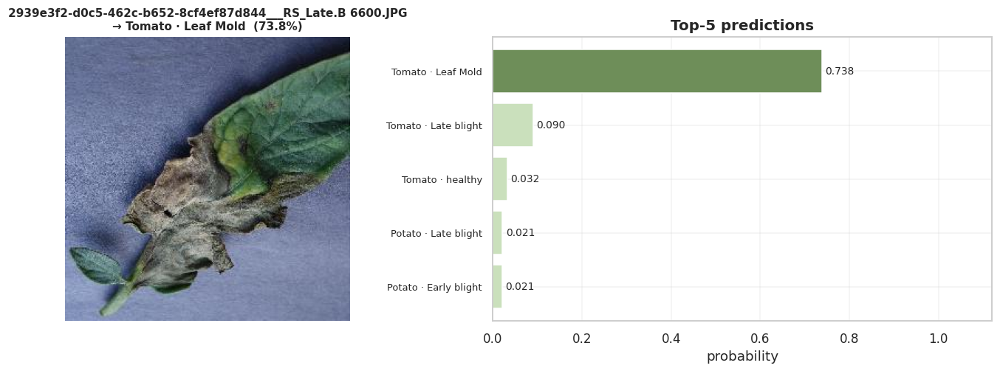

Ground truth: Pepper · bell Bacterial spot


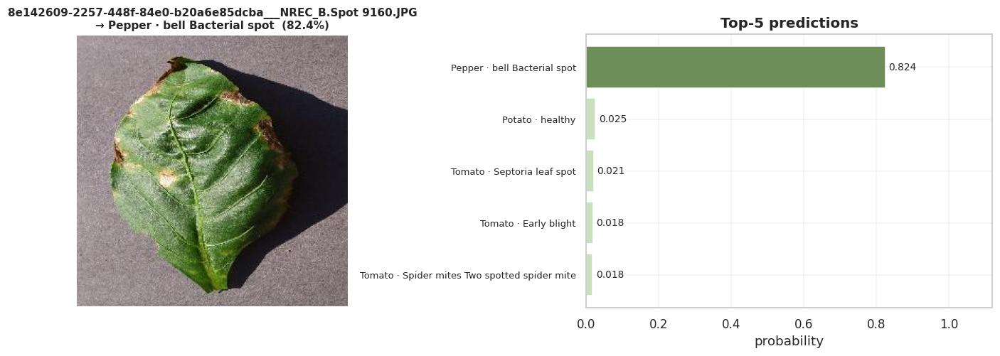

Ground truth: Tomato · Tomato YellowLeaf Curl Virus


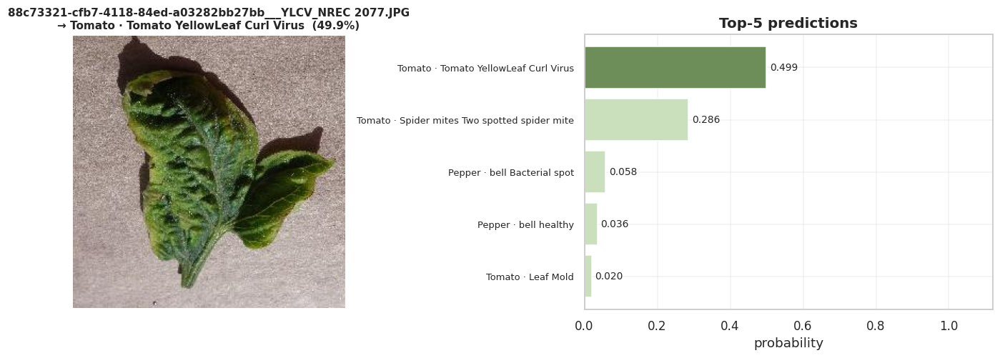

In [35]:
def predict_image(img_path, model=None, topk=5, show=True):
    model = model or models[BEST]
    pil = Image.open(img_path).convert("RGB")
    arr = np.array(pil.resize((CFG.IMG_SIZE, CFG.IMG_SIZE)), dtype=np.float32)[None]
    probs_ = model.predict(arr, verbose=0)[0]
    order = probs_.argsort()[::-1][:topk]
    if show:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4.6),
                                 gridspec_kw={"width_ratios": [1, 1.5]})
        axes[0].imshow(pil); axes[0].axis("off")
        axes[0].set_title(f"{Path(img_path).name}\n→ {PRETTY[order[0]]}  ({probs_[order[0]]*100:.1f}%)",
                          fontsize=10)
        bars = axes[1].barh([PRETTY[i] for i in order][::-1], probs_[order][::-1],
                            color=["#CAE0BC"] * (topk - 1) + ["#6E8E59"])
        axes[1].bar_label(bars, fmt="%.3f", fontsize=9, padding=3)
        axes[1].set(xlim=(0, 1.12), xlabel="probability", title=f"Top-{topk} predictions")
        axes[1].tick_params(axis="y", labelsize=8.5)
        plt.tight_layout(); plt.show()
    return [(CLASSES[i], PRETTY[i], float(probs_[i])) for i in order]

demo = test_df.sample(3, random_state=7)
for _, r in demo.iterrows():
    print(f"Ground truth: {prettify(r.label)}")
    predict_image(r.filepath)

In [36]:
class TFLitePlantClassifier:
    """Deployment-shaped wrapper — mirrors what the Flutter/Android side would do."""
    def __init__(self, model_path, labels_path=None):
        self.interp = tf.lite.Interpreter(model_path=str(model_path))
        self.interp.allocate_tensors()
        self.inp = self.interp.get_input_details()[0]
        self.out = self.interp.get_output_details()[0]
        self.size = self.inp["shape"][1]
        self.labels = (Path(labels_path).read_text().splitlines() if labels_path else CLASSES)

    def predict(self, img_path, topk=3):
        img = np.array(Image.open(img_path).convert("RGB").resize((self.size, self.size)),
                       dtype=np.float32)[None]
        self.interp.set_tensor(self.inp["index"], img)
        self.interp.invoke()
        p = self.interp.get_tensor(self.out["index"])[0]
        idx = p.argsort()[::-1][:topk]
        return [{"label": self.labels[i], "readable": prettify(self.labels[i]),
                 "confidence": round(float(p[i]), 4)} for i in idx]

best_slug = next(r["slug"] for r in export_rows if r["model"] == BEST)
tflite_path = MODEL_DIR / f"{best_slug}_fp16.tflite"
if tflite_path.exists():
    clf = TFLitePlantClassifier(tflite_path, MODEL_DIR / "labels.txt")
    for _, r in demo.iterrows():
        out = clf.predict(r.filepath)
        print(f"true: {prettify(r.label)}")
        for o in out:
            print(f"    {o['readable']:<45} {o['confidence']*100:6.2f}%")
        print()
else:
    print("fp16 TFLite not available — check the export log above.")

true: Tomato · Late blight
    Tomato · Leaf Mold                             73.86%
    Tomato · Late blight                            8.97%
    Tomato · healthy                                3.23%

true: Pepper · bell Bacterial spot
    Pepper · bell Bacterial spot                   82.31%
    Potato · healthy                                2.55%
    Tomato · Septoria leaf spot                     2.08%

true: Tomato · Tomato YellowLeaf Curl Virus
    Tomato · Tomato YellowLeaf Curl Virus          49.63%
    Tomato · Spider mites Two spotted spider mite  28.87%
    Pepper · bell Bacterial spot                    5.83%



<div style="background:#0b0b0b;color:#FFD166;padding:12px;border-radius:8px;text-align:center;font-size:20px;font-weight:600">11 · Summary</div>

In [37]:
print("=" * 78)
print(f"PLANTVILLAGE CROP-DISEASE CLASSIFICATION — {NUM_CLASSES} classes, {len(df):,} images")
print("=" * 78)
print(f"Split      : train {len(train_df):,} / val {len(val_df):,} / test {len(test_df):,} (stratified)")
print(f"Input      : {CFG.IMG_SIZE}×{CFG.IMG_SIZE}×3, raw [0,255] — normalisation inside the model")
print(f"Best model : {BEST}\n")

final = res_df[["accuracy", "balanced_accuracy", "f1_macro", "f1_weighted", "top3_accuracy",
                "cohen_kappa", "mcc", "roc_auc_macro", "pr_auc_macro", "log_loss"]].astype(float)
for name in final.index:
    r = final.loc[name]
    print(f"{name}")
    print(f"   accuracy {r.accuracy*100:6.2f}%   balanced {r.balanced_accuracy*100:6.2f}%   "
          f"macro-F1 {r.f1_macro*100:6.2f}%   top-3 {r.top3_accuracy*100:6.2f}%")
    print(f"   kappa    {r.cohen_kappa:6.4f}    MCC     {r.mcc:6.4f}    "
          f"ROC-AUC  {r.roc_auc_macro:6.4f}    log-loss {r.log_loss:6.4f}")
    if name in timings:
        print(f"   trained in {timings[name]/60:.1f} min")
print("\nArtifacts written:")
for p in sorted(CFG.OUT_DIR.rglob("*")):
    if p.is_file():
        print(f"   {p.relative_to(CFG.OUT_DIR)}  ({p.stat().st_size/1e6:.2f} MB)")

final.round(4).to_csv(CFG.OUT_DIR / "final_test_metrics.csv")

PLANTVILLAGE CROP-DISEASE CLASSIFICATION — 15 classes, 20,624 images
Split      : train 14,436 / val 3,094 / test 3,094 (stratified)
Input      : 224×224×3, raw [0,255] — normalisation inside the model
Best model : Custom CNN

Custom CNN
   accuracy  95.51%   balanced  94.86%   macro-F1  94.59%   top-3  99.81%
   kappa    0.9509    MCC     0.9511    ROC-AUC  0.9992    log-loss 0.1663
   trained in 112.3 min
EfficientNetB3
   accuracy  87.10%   balanced  88.06%   macro-F1  86.92%   top-3  97.41%
   kappa    0.8594    MCC     0.8605    ROC-AUC  0.9932    log-loss 0.4437
   trained in 60.6 min

Artifacts written:
   class_indices.json  (0.00 MB)
   classification_report_Custom_CNN.csv  (0.00 MB)
   figures/01_class_distribution.png  (0.14 MB)
   figures/02_imbalance_curve.png  (0.14 MB)
   figures/03_sample_grid.png  (6.77 MB)
   figures/04_resolution_filesize.png  (0.11 MB)
   figures/05_colour_distributions.png  (0.48 MB)
   figures/06_mean_image_per_class.png  (0.34 MB)
   figures/07_s

### Reading the results honestly

PlantVillage is an easy benchmark: uniform lighting, single centred leaf, constant background. Accuracy above 99% on its held-out split is expected and is **not** evidence that the model works in a field. Published work consistently finds that models trained on PlantVillage collapse — often to 30-50% accuracy — on field-collected images such as PlantDoc.

Before this goes anywhere near a farmer's phone:

1. **Validate on field imagery.** Test against PlantDoc or your own photographs. That number, not the one above, is the deployment number.
2. **Keep the abstention threshold.** The risk-coverage curve in §8 shows the accuracy available at each confidence cut-off. Route low-confidence cases to "unclear — try another photo" or to a human agronomist rather than guessing.
3. **Add a not-a-leaf / unknown-disease path.** A 15-class softmax will confidently classify a hand, a shoe, or a disease it has never seen. An out-of-distribution check in front of the classifier prevents the worst failure mode.
4. **Watch the crop-level prior.** The dataset only covers pepper, potato and tomato. Anything else is out of scope and should be rejected at the UI level.

### Suggested next steps

- Swap in EfficientNetV2-S or ConvNeXt-Tiny and compare at equal training budget.
- Train at 300×300 (EfficientNetB3's native resolution) — usually worth ~0.3-0.6 pp.
- Add int8 quantisation with a representative dataset for a further ~4× size reduction if the target device is low-end.
- Combine PlantVillage with PlantDoc and background-augmented crops to close the lab-to-field gap.